In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 1972)
(11, 1972)


[I 2025-05-19 14:57:32,267] A new study created in memory with name: no-name-f7fdd618-9143-4902-b950-c0e741d03a0c
[I 2025-05-19 15:00:23,579] Trial 0 finished with value: 0.06061703041195869 and parameters: {'lr': 0.3691413979809218, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.46261542141091494}. Best is trial 0 with value: 0.06061703041195869.


Cross Validation Accuracies:
[0.03843351826071739, 0.06501271575689316, 0.06806440651416779, 0.06778811663389206, 0.06378639489412308]
Mean Cross Validation Accuracy:
0.06061703041195869
Standard Deviation of Cross Validation Accuracy:
0.011210379303546378


[I 2025-05-19 15:07:27,974] Trial 1 finished with value: 2.6598403334617613 and parameters: {'lr': 0.3741950224550143, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23468377894375891}. Best is trial 0 with value: 0.06061703041195869.


Cross Validation Accuracies:
[0.5088492035865784, 1.5577861070632935, 1.2535319328308105, 8.444356918334961, 1.534677505493164]
Mean Cross Validation Accuracy:
2.6598403334617613
Standard Deviation of Cross Validation Accuracy:
2.9170400472576654


[I 2025-05-19 15:15:27,465] Trial 2 finished with value: 2.6421457290649415 and parameters: {'lr': 0.21170762588816516, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.2354424397967641}. Best is trial 0 with value: 0.06061703041195869.


Cross Validation Accuracies:
[2.434446334838867, 3.075974225997925, 3.3475255966186523, 0.7124273777008057, 3.640355110168457]
Mean Cross Validation Accuracy:
2.6421457290649415
Standard Deviation of Cross Validation Accuracy:
1.0439484512922736


[I 2025-05-19 15:20:51,775] Trial 3 finished with value: 0.049473370611667636 and parameters: {'lr': 0.005743464294017881, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.1973421541536281}. Best is trial 3 with value: 0.049473370611667636.


Cross Validation Accuracies:
[0.0526181124150753, 0.035798922181129456, 0.057584282010793686, 0.04821944609284401, 0.05314609035849571]
Mean Cross Validation Accuracy:
0.049473370611667636
Standard Deviation of Cross Validation Accuracy:
0.0074528923466217955


[I 2025-05-19 15:31:04,034] Trial 4 finished with value: 7.094757401943207 and parameters: {'lr': 0.0886942642988431, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2625242471667337}. Best is trial 3 with value: 0.049473370611667636.


Cross Validation Accuracies:
[9.842127799987793, 10.424004554748535, 0.381483256816864, 9.335053443908691, 5.49111795425415]
Mean Cross Validation Accuracy:
7.094757401943207
Standard Deviation of Cross Validation Accuracy:
3.7759916919920933


[I 2025-05-19 15:39:15,457] Trial 5 finished with value: 0.09009208232164383 and parameters: {'lr': 0.09691697944169557, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.30224496556780867}. Best is trial 3 with value: 0.049473370611667636.


Cross Validation Accuracies:
[0.08519648760557175, 0.09287495911121368, 0.09812065958976746, 0.09479724615812302, 0.07947105914354324]
Mean Cross Validation Accuracy:
0.09009208232164383
Standard Deviation of Cross Validation Accuracy:
0.006798735233527665


[I 2025-05-19 15:46:59,757] Trial 6 finished with value: 0.04418917819857597 and parameters: {'lr': 0.004580798891785286, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.21690470639886758}. Best is trial 6 with value: 0.04418917819857597.


Cross Validation Accuracies:
[0.03519059345126152, 0.03527476266026497, 0.05949584022164345, 0.04699883237481117, 0.04398586228489876]
Mean Cross Validation Accuracy:
0.04418917819857597
Standard Deviation of Cross Validation Accuracy:
0.008974081881546294


[I 2025-05-19 15:56:09,353] Trial 7 finished with value: 0.14619232714176178 and parameters: {'lr': 0.8905064425149505, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.17588056603160138}. Best is trial 6 with value: 0.04418917819857597.


Cross Validation Accuracies:
[0.16507786512374878, 0.15389719605445862, 0.13646580278873444, 0.14664380252361298, 0.1288769692182541]
Mean Cross Validation Accuracy:
0.14619232714176178
Standard Deviation of Cross Validation Accuracy:
0.012733100768159717


[I 2025-05-19 16:05:07,727] Trial 8 finished with value: 0.04833064079284668 and parameters: {'lr': 0.14353077096033678, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.4340931431989754}. Best is trial 6 with value: 0.04418917819857597.


Cross Validation Accuracies:
[0.0442841500043869, 0.0428473986685276, 0.05752810090780258, 0.04901457205414772, 0.04797898232936859]
Mean Cross Validation Accuracy:
0.04833064079284668
Standard Deviation of Cross Validation Accuracy:
0.005130784152667548


[I 2025-05-19 16:12:17,737] Trial 9 finished with value: 0.04395226240158081 and parameters: {'lr': 0.0025848965509496545, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.47897290902092415}. Best is trial 9 with value: 0.04395226240158081.


Cross Validation Accuracies:
[0.03406929969787598, 0.03481448069214821, 0.057451967149972916, 0.04984353855252266, 0.04358202591538429]
Mean Cross Validation Accuracy:
0.04395226240158081
Standard Deviation of Cross Validation Accuracy:
0.008924777245491223


[I 2025-05-19 16:17:57,698] Trial 10 finished with value: 0.08272558897733688 and parameters: {'lr': 0.0017982441972026796, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3686109688076171}. Best is trial 9 with value: 0.04395226240158081.


Cross Validation Accuracies:
[0.10647182166576385, 0.10098754614591599, 0.08867495507001877, 0.06313202530145645, 0.05436159670352936]
Mean Cross Validation Accuracy:
0.08272558897733688
Standard Deviation of Cross Validation Accuracy:
0.020597093963246767


[I 2025-05-19 16:24:00,273] Trial 11 finished with value: 0.04289371445775032 and parameters: {'lr': 0.009104805370848216, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.10893325391365691}. Best is trial 11 with value: 0.04289371445775032.


Cross Validation Accuracies:
[0.03748411685228348, 0.03171130269765854, 0.054701223969459534, 0.04750169441103935, 0.0430702343583107]
Mean Cross Validation Accuracy:
0.04289371445775032
Standard Deviation of Cross Validation Accuracy:
0.007937153122116552


[I 2025-05-19 16:30:30,213] Trial 12 finished with value: 0.04267043024301529 and parameters: {'lr': 0.01802747852711384, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.10288764986929473}. Best is trial 12 with value: 0.04267043024301529.


Cross Validation Accuracies:
[0.039264943450689316, 0.03172629699110985, 0.055436812341213226, 0.04477939009666443, 0.04214470833539963]
Mean Cross Validation Accuracy:
0.04267043024301529
Standard Deviation of Cross Validation Accuracy:
0.007734028704288712


[I 2025-05-19 16:36:28,267] Trial 13 finished with value: 0.04189054407179356 and parameters: {'lr': 0.016938032607581352, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.11183030594862123}. Best is trial 13 with value: 0.04189054407179356.


Cross Validation Accuracies:
[0.03676604852080345, 0.030480636283755302, 0.05440588295459747, 0.04529241845011711, 0.04250773414969444]
Mean Cross Validation Accuracy:
0.04189054407179356
Standard Deviation of Cross Validation Accuracy:
0.008062677354492495


[I 2025-05-19 16:43:03,973] Trial 14 finished with value: 0.041783614456653594 and parameters: {'lr': 0.019978515033166114, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.11200909345458414}. Best is trial 14 with value: 0.041783614456653594.


Cross Validation Accuracies:
[0.03697831556200981, 0.0337088480591774, 0.05365803465247154, 0.042844194918870926, 0.041728679090738297]
Mean Cross Validation Accuracy:
0.041783614456653594
Standard Deviation of Cross Validation Accuracy:
0.006788555864670924


[I 2025-05-19 16:48:49,970] Trial 15 finished with value: 0.043298129737377164 and parameters: {'lr': 0.03494735607602869, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.15249324614236584}. Best is trial 14 with value: 0.041783614456653594.


Cross Validation Accuracies:
[0.03882918134331703, 0.03412913158535957, 0.055768754333257675, 0.043580494821071625, 0.04418308660387993]
Mean Cross Validation Accuracy:
0.043298129737377164
Standard Deviation of Cross Validation Accuracy:
0.007216943721104035


[I 2025-05-19 16:51:53,701] Trial 16 finished with value: 0.04104811958968639 and parameters: {'lr': 0.03378295323257334, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.143424151787575}. Best is trial 16 with value: 0.04104811958968639.


Cross Validation Accuracies:
[0.0380186066031456, 0.030463604256510735, 0.053343962877988815, 0.04283307120203972, 0.0405813530087471]
Mean Cross Validation Accuracy:
0.04104811958968639
Standard Deviation of Cross Validation Accuracy:
0.007426999383921696


[I 2025-05-19 16:55:22,965] Trial 17 finished with value: 0.040209383517503736 and parameters: {'lr': 0.029207095247007705, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3231761840508425}. Best is trial 17 with value: 0.040209383517503736.


Cross Validation Accuracies:
[0.03164857253432274, 0.0384691059589386, 0.050482723861932755, 0.03794131800532341, 0.04250519722700119]
Mean Cross Validation Accuracy:
0.040209383517503736
Standard Deviation of Cross Validation Accuracy:
0.00620116850697236


[I 2025-05-19 16:59:39,196] Trial 18 finished with value: 3.488737630844116 and parameters: {'lr': 0.047608859790599777, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3337039133109492}. Best is trial 17 with value: 0.040209383517503736.


Cross Validation Accuracies:
[4.770962238311768, 4.806281566619873, 3.379892110824585, 0.7703659534454346, 3.716186285018921]
Mean Cross Validation Accuracy:
3.488737630844116
Standard Deviation of Cross Validation Accuracy:
1.4719474705771685


[I 2025-05-19 17:03:23,653] Trial 19 finished with value: 0.03268814533948898 and parameters: {'lr': 0.0010487233060817367, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.37338543309620453}. Best is trial 19 with value: 0.03268814533948898.


Cross Validation Accuracies:
[0.029601065441966057, 0.026297716423869133, 0.041977182030677795, 0.031030289828777313, 0.03453447297215462]
Mean Cross Validation Accuracy:
0.03268814533948898
Standard Deviation of Cross Validation Accuracy:
0.0053443663289687434


[I 2025-05-19 17:07:09,392] Trial 20 finished with value: 0.03390083275735378 and parameters: {'lr': 0.001440679175571243, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4018108036663935}. Best is trial 19 with value: 0.03268814533948898.


Cross Validation Accuracies:
[0.03867274522781372, 0.02206193096935749, 0.04738452285528183, 0.030688615515828133, 0.03069634921848774]
Mean Cross Validation Accuracy:
0.03390083275735378
Standard Deviation of Cross Validation Accuracy:
0.008547838290306314


[I 2025-05-19 17:11:19,276] Trial 21 finished with value: 0.028796060383319853 and parameters: {'lr': 0.0010112475432860603, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3901111397937987}. Best is trial 21 with value: 0.028796060383319853.


Cross Validation Accuracies:
[0.02379128523170948, 0.02070457488298416, 0.037261150777339935, 0.027446048334240913, 0.03477724269032478]
Mean Cross Validation Accuracy:
0.028796060383319853
Standard Deviation of Cross Validation Accuracy:
0.006320992669217986


[I 2025-05-19 17:15:41,229] Trial 22 finished with value: 0.027741847932338713 and parameters: {'lr': 0.001015186904832881, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.39003695433693425}. Best is trial 22 with value: 0.027741847932338713.


Cross Validation Accuracies:
[0.024414217099547386, 0.031921375542879105, 0.03673793375492096, 0.02392151765525341, 0.021714195609092712]
Mean Cross Validation Accuracy:
0.027741847932338713
Standard Deviation of Cross Validation Accuracy:
0.005663897140482441


[I 2025-05-19 17:21:14,340] Trial 23 finished with value: 0.03173599652945995 and parameters: {'lr': 0.001187958877456215, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.37746437395550336}. Best is trial 22 with value: 0.027741847932338713.


Cross Validation Accuracies:
[0.04421544075012207, 0.02182457409799099, 0.03256027400493622, 0.03146756440401077, 0.028612129390239716]
Mean Cross Validation Accuracy:
0.03173599652945995
Standard Deviation of Cross Validation Accuracy:
0.007273002925033015


[I 2025-05-19 17:27:07,651] Trial 24 finished with value: 0.0466080442070961 and parameters: {'lr': 0.0034476152194143836, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4217396321514052}. Best is trial 22 with value: 0.027741847932338713.


Cross Validation Accuracies:
[0.048112109303474426, 0.036442846059799194, 0.059849370270967484, 0.044211167842149734, 0.04442472755908966]
Mean Cross Validation Accuracy:
0.0466080442070961
Standard Deviation of Cross Validation Accuracy:
0.007634632525695159


[I 2025-05-19 17:35:35,309] Trial 25 finished with value: 0.03093869090080261 and parameters: {'lr': 0.001053072917168338, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.37360641995184674}. Best is trial 22 with value: 0.027741847932338713.


Cross Validation Accuracies:
[0.0430181510746479, 0.025119425728917122, 0.02735915593802929, 0.03274638578295708, 0.02645033597946167]
Mean Cross Validation Accuracy:
0.03093869090080261
Standard Deviation of Cross Validation Accuracy:
0.006572721909054779


[I 2025-05-19 17:40:58,041] Trial 26 finished with value: 0.04356287531554699 and parameters: {'lr': 0.0024595972636387905, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3459477565520036}. Best is trial 22 with value: 0.027741847932338713.


Cross Validation Accuracies:
[0.03702306002378464, 0.029965994879603386, 0.05127105861902237, 0.05201534181833267, 0.04753892123699188]
Mean Cross Validation Accuracy:
0.04356287531554699
Standard Deviation of Cross Validation Accuracy:
0.00865232411124137


[I 2025-05-19 17:46:44,140] Trial 27 finished with value: 0.06748900711536407 and parameters: {'lr': 0.00599475118666545, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.44430704651659614}. Best is trial 22 with value: 0.027741847932338713.


Cross Validation Accuracies:
[0.08179735392332077, 0.046882275491952896, 0.055050645023584366, 0.06729844957590103, 0.08641631156206131]
Mean Cross Validation Accuracy:
0.06748900711536407
Standard Deviation of Cross Validation Accuracy:
0.01511527832291614


[I 2025-05-19 17:52:59,448] Trial 28 finished with value: 0.0434155635535717 and parameters: {'lr': 0.0022973789530697074, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4013360527097512}. Best is trial 22 with value: 0.027741847932338713.


Cross Validation Accuracies:
[0.03658492490649223, 0.034716758877038956, 0.05609101057052612, 0.04154830798506737, 0.048136815428733826]
Mean Cross Validation Accuracy:
0.0434155635535717
Standard Deviation of Cross Validation Accuracy:
0.007858379563674621


[I 2025-05-19 17:59:42,349] Trial 29 finished with value: 0.08428542390465736 and parameters: {'lr': 0.009457891926501696, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4675680275924334}. Best is trial 22 with value: 0.027741847932338713.


Cross Validation Accuracies:
[0.11180389672517776, 0.07198924571275711, 0.10790122300386429, 0.07450538128614426, 0.0552273727953434]
Mean Cross Validation Accuracy:
0.08428542390465736
Standard Deviation of Cross Validation Accuracy:
0.021937127795070264


[I 2025-05-19 18:06:10,755] Trial 30 finished with value: 0.02666199952363968 and parameters: {'lr': 0.0010888132042249114, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.29047072725641265}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[0.023250730708241463, 0.021465307101607323, 0.0350520983338356, 0.03117430955171585, 0.022367551922798157]
Mean Cross Validation Accuracy:
0.02666199952363968
Standard Deviation of Cross Validation Accuracy:
0.005437634542534432


[I 2025-05-19 18:12:39,632] Trial 31 finished with value: 0.027437960356473924 and parameters: {'lr': 0.0010069296776390477, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2918234617808634}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[0.031042760238051414, 0.03270845487713814, 0.025483546778559685, 0.03346126154065132, 0.014493778347969055]
Mean Cross Validation Accuracy:
0.027437960356473924
Standard Deviation of Cross Validation Accuracy:
0.007048750699758391


[I 2025-05-19 18:18:10,742] Trial 32 finished with value: 0.029604888707399368 and parameters: {'lr': 0.0017592503073111684, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2793125196462173}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[0.01929164119064808, 0.0299228448420763, 0.0346393808722496, 0.03175201639533043, 0.03241856023669243]
Mean Cross Validation Accuracy:
0.029604888707399368
Standard Deviation of Cross Validation Accuracy:
0.005372842573281453


[I 2025-05-19 18:24:31,736] Trial 33 finished with value: 0.04531574696302414 and parameters: {'lr': 0.003309010633116793, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.30530135176295903}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[0.042923230677843094, 0.03431307151913643, 0.06083016097545624, 0.0429362952709198, 0.04557597637176514]
Mean Cross Validation Accuracy:
0.04531574696302414
Standard Deviation of Cross Validation Accuracy:
0.008639554999509726


[I 2025-05-19 18:31:06,961] Trial 34 finished with value: 0.02940099984407425 and parameters: {'lr': 0.0016579077232418472, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.26651014574886106}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[0.032767269760370255, 0.02402307838201523, 0.030656812712550163, 0.024306273087859154, 0.03525156527757645]
Mean Cross Validation Accuracy:
0.02940099984407425
Standard Deviation of Cross Validation Accuracy:
0.004516995350324129


[I 2025-05-19 18:39:22,426] Trial 35 finished with value: 0.045774825662374494 and parameters: {'lr': 0.0010280461897212792, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23622283355550344}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[0.03803318738937378, 0.03277252987027168, 0.05790114775300026, 0.05557927116751671, 0.04458799213171005]
Mean Cross Validation Accuracy:
0.045774825662374494
Standard Deviation of Cross Validation Accuracy:
0.009732174186210758


[I 2025-05-19 18:46:50,873] Trial 36 finished with value: 0.06013182252645492 and parameters: {'lr': 0.0037719070938157864, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2876250310412}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[0.06386468559503555, 0.0503336563706398, 0.06978896260261536, 0.06886109709739685, 0.04781071096658707]
Mean Cross Validation Accuracy:
0.06013182252645492
Standard Deviation of Cross Validation Accuracy:
0.00928664315844989


[I 2025-05-19 18:54:33,439] Trial 37 finished with value: 0.05929189622402191 and parameters: {'lr': 0.006520794367761395, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2505361485371076}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[0.057156678289175034, 0.05496395006775856, 0.06114223226904869, 0.06976257264614105, 0.05343404784798622]
Mean Cross Validation Accuracy:
0.05929189622402191
Standard Deviation of Cross Validation Accuracy:
0.005842319220543799


[I 2025-05-19 19:00:50,611] Trial 38 finished with value: 0.09149363189935684 and parameters: {'lr': 0.0018893284137710391, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3524086923114667}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[0.09125033020973206, 0.07368893921375275, 0.09775350242853165, 0.1114455983042717, 0.08332978934049606]
Mean Cross Validation Accuracy:
0.09149363189935684
Standard Deviation of Cross Validation Accuracy:
0.01281391076238419


[I 2025-05-19 19:06:22,094] Trial 39 finished with value: 0.041687408834695815 and parameters: {'lr': 0.002672022083527524, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.319469136432639}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[0.035274192690849304, 0.03977058827877045, 0.05646893009543419, 0.038205586373806, 0.03871774673461914]
Mean Cross Validation Accuracy:
0.041687408834695815
Standard Deviation of Cross Validation Accuracy:
0.007539746597476081


[I 2025-05-19 19:13:46,064] Trial 40 finished with value: 5.613196754455567 and parameters: {'lr': 0.672303892395638, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.20597512737526047}. Best is trial 30 with value: 0.02666199952363968.


Cross Validation Accuracies:
[3.4325203895568848, 7.641238689422607, 7.629746913909912, 7.295726299285889, 2.066751480102539]
Mean Cross Validation Accuracy:
5.613196754455567
Standard Deviation of Cross Validation Accuracy:
2.3808804168716993


[I 2025-05-19 19:19:50,724] Trial 41 finished with value: 0.02546161487698555 and parameters: {'lr': 0.001528022949060638, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2676539726161524}. Best is trial 41 with value: 0.02546161487698555.


Cross Validation Accuracies:
[0.021133026108145714, 0.027247261255979538, 0.02900104410946369, 0.025712313130497932, 0.024214429780840874]
Mean Cross Validation Accuracy:
0.02546161487698555
Standard Deviation of Cross Validation Accuracy:
0.002685929756736802


[I 2025-05-19 19:26:10,372] Trial 42 finished with value: 0.025446711853146554 and parameters: {'lr': 0.0013950164788450415, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3001493881543675}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.0220822524279356, 0.018678177148103714, 0.039311133325099945, 0.030640440061688423, 0.016521556302905083]
Mean Cross Validation Accuracy:
0.025446711853146554
Standard Deviation of Cross Validation Accuracy:
0.008437867578119866


[I 2025-05-19 19:31:57,364] Trial 43 finished with value: 0.02940131276845932 and parameters: {'lr': 0.0013584158771899754, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.30026628696738594}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.025964530184864998, 0.024409063160419464, 0.03849736973643303, 0.0318945050239563, 0.02624109573662281]
Mean Cross Validation Accuracy:
0.02940131276845932
Standard Deviation of Cross Validation Accuracy:
0.005209131642638225


[I 2025-05-19 19:38:29,552] Trial 44 finished with value: 0.037115276977419856 and parameters: {'lr': 0.00193016911257296, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2524931722470245}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.04417635127902031, 0.026943357661366463, 0.047376636415719986, 0.03678765892982483, 0.03029238060116768]
Mean Cross Validation Accuracy:
0.037115276977419856
Standard Deviation of Cross Validation Accuracy:
0.007813852557262628


[I 2025-05-19 19:44:18,834] Trial 45 finished with value: 0.054979820549488065 and parameters: {'lr': 0.004277683872995007, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.22439941757722837}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.06635154038667679, 0.0393163226544857, 0.05942481383681297, 0.06561139971017838, 0.0441950261592865]
Mean Cross Validation Accuracy:
0.054979820549488065
Standard Deviation of Cross Validation Accuracy:
0.011169256100345862


[I 2025-05-19 19:51:13,486] Trial 46 finished with value: 0.054293520748615265 and parameters: {'lr': 0.0014284600887470081, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.28278549229520644}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.051267918199300766, 0.051027070730924606, 0.07135111838579178, 0.04607514292001724, 0.05174635350704193]
Mean Cross Validation Accuracy:
0.054293520748615265
Standard Deviation of Cross Validation Accuracy:
0.008772860408628822


[I 2025-05-19 19:57:23,627] Trial 47 finished with value: 1.4996712327003479 and parameters: {'lr': 0.2250032136466364, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.31682890290698545}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[1.1704405546188354, 1.3797715902328491, 2.3256494998931885, 1.7358816862106323, 0.8866128325462341]
Mean Cross Validation Accuracy:
1.4996712327003479
Standard Deviation of Cross Validation Accuracy:
0.49732179559633005


[I 2025-05-19 20:04:12,269] Trial 48 finished with value: 0.06576078981161118 and parameters: {'lr': 0.00861549840601239, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.18000204303335293}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.07742816209793091, 0.043183647096157074, 0.06448269635438919, 0.07453307509422302, 0.06917636841535568]
Mean Cross Validation Accuracy:
0.06576078981161118
Standard Deviation of Cross Validation Accuracy:
0.012133487861491791


[I 2025-05-19 20:11:44,580] Trial 49 finished with value: 0.05310346633195877 and parameters: {'lr': 0.0027717392021931156, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2676701030383258}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.04515649750828743, 0.04264512285590172, 0.05686395987868309, 0.04870551452040672, 0.07214623689651489]
Mean Cross Validation Accuracy:
0.05310346633195877
Standard Deviation of Cross Validation Accuracy:
0.010664348684974657


[I 2025-05-19 20:17:09,059] Trial 50 finished with value: 0.046623563021421434 and parameters: {'lr': 0.0021318437246261547, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.49877885721951254}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.044406771659851074, 0.0358094722032547, 0.056423090398311615, 0.04681144654750824, 0.049667034298181534]
Mean Cross Validation Accuracy:
0.046623563021421434
Standard Deviation of Cross Validation Accuracy:
0.006740734063980714


[I 2025-05-19 20:23:11,458] Trial 51 finished with value: 0.029337810724973677 and parameters: {'lr': 0.0013975080097848296, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.39688914651703}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.02512592077255249, 0.022164639085531235, 0.033990584313869476, 0.03252141550183296, 0.03288649395108223]
Mean Cross Validation Accuracy:
0.029337810724973677
Standard Deviation of Cross Validation Accuracy:
0.004765945917113195


[I 2025-05-19 20:29:20,079] Trial 52 finished with value: 0.027692730724811553 and parameters: {'lr': 0.0010637542978721643, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.35151183406951914}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.023404402658343315, 0.028056485578417778, 0.03315138816833496, 0.024946413934230804, 0.02890496328473091]
Mean Cross Validation Accuracy:
0.027692730724811553
Standard Deviation of Cross Validation Accuracy:
0.0033861712885933336


[I 2025-05-19 20:35:10,572] Trial 53 finished with value: 0.02950197644531727 and parameters: {'lr': 0.0013934359665146248, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.34371863752160353}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.023228222504258156, 0.024382084608078003, 0.034125134348869324, 0.03894928842782974, 0.026825152337551117]
Mean Cross Validation Accuracy:
0.02950197644531727
Standard Deviation of Cross Validation Accuracy:
0.006055806485316413


[I 2025-05-19 20:41:06,563] Trial 54 finished with value: 0.04076087325811386 and parameters: {'lr': 0.0016613121378701717, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.35485039551456077}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.04002569615840912, 0.03213650360703468, 0.05490386486053467, 0.04289275407791138, 0.03384554758667946]
Mean Cross Validation Accuracy:
0.04076087325811386
Standard Deviation of Cross Validation Accuracy:
0.008090872557201126


[I 2025-05-19 20:47:34,383] Trial 55 finished with value: 0.04645292684435844 and parameters: {'lr': 0.00490535783720466, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2902943679020287}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.04954831302165985, 0.033539067953825, 0.056896958500146866, 0.04279637709259987, 0.04948391765356064]
Mean Cross Validation Accuracy:
0.04645292684435844
Standard Deviation of Cross Validation Accuracy:
0.007848365761493318


[I 2025-05-19 20:54:33,467] Trial 56 finished with value: 0.1327018544077873 and parameters: {'lr': 0.0028476911794582064, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3299167156006283}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.2091311812400818, 0.1713954359292984, 0.06528610736131668, 0.1753498911857605, 0.04234665632247925]
Mean Cross Validation Accuracy:
0.1327018544077873
Standard Deviation of Cross Validation Accuracy:
0.06613083254108304


[I 2025-05-19 21:02:28,337] Trial 57 finished with value: 0.025843533873558044 and parameters: {'lr': 0.00122519442193161, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.308024784799359}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.02567284181714058, 0.024414198473095894, 0.03302803263068199, 0.02545241266489029, 0.020650183781981468]
Mean Cross Validation Accuracy:
0.025843533873558044
Standard Deviation of Cross Validation Accuracy:
0.004020274090899824


[I 2025-05-19 21:09:13,943] Trial 58 finished with value: 0.5331517636775971 and parameters: {'lr': 0.06345728798941076, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3107017351482445}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.642019510269165, 0.32591474056243896, 0.674293041229248, 0.7181740999221802, 0.305357426404953]
Mean Cross Validation Accuracy:
0.5331517636775971
Standard Deviation of Cross Validation Accuracy:
0.1793564915074764


[I 2025-05-19 21:15:32,124] Trial 59 finished with value: 0.030164777487516403 and parameters: {'lr': 0.0013097067410123109, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.23682998459999322}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.03820987045764923, 0.02057611010968685, 0.029284680262207985, 0.03573813661932945, 0.027015089988708496]
Mean Cross Validation Accuracy:
0.030164777487516403
Standard Deviation of Cross Validation Accuracy:
0.006299579310700669


[I 2025-05-19 21:21:18,719] Trial 60 finished with value: 0.04416447505354881 and parameters: {'lr': 0.0019867975287435067, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.25643529299652534}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.039904575794935226, 0.03412914276123047, 0.05648290738463402, 0.04509769007563591, 0.04520805925130844]
Mean Cross Validation Accuracy:
0.04416447505354881
Standard Deviation of Cross Validation Accuracy:
0.007383202140827134


[I 2025-05-19 21:28:45,040] Trial 61 finished with value: 0.02568921260535717 and parameters: {'lr': 0.0010628652828465223, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3341555793076567}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.021245744079351425, 0.019832398742437363, 0.033524684607982635, 0.027347303926944733, 0.026495931670069695]
Mean Cross Validation Accuracy:
0.02568921260535717
Standard Deviation of Cross Validation Accuracy:
0.004875271585266106


[I 2025-05-19 21:37:17,657] Trial 62 finished with value: 0.02997797876596451 and parameters: {'lr': 0.0013372986715075115, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2982573310850493}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.022611141204833984, 0.03572099283337593, 0.037411484867334366, 0.03239556401968002, 0.021750710904598236]
Mean Cross Validation Accuracy:
0.02997797876596451
Standard Deviation of Cross Validation Accuracy:
0.006573312317413877


[I 2025-05-19 21:44:20,270] Trial 63 finished with value: 0.027669545635581015 and parameters: {'lr': 0.0010049978215591925, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.33492224182667496}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.027139997109770775, 0.021515674889087677, 0.035118553787469864, 0.03331291303038597, 0.021260589361190796]
Mean Cross Validation Accuracy:
0.027669545635581015
Standard Deviation of Cross Validation Accuracy:
0.005771665016828927


[I 2025-05-19 21:51:57,378] Trial 64 finished with value: 0.03143232315778732 and parameters: {'lr': 0.0016959752251957663, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.335687935887498}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.026842273771762848, 0.029751481488347054, 0.04630952700972557, 0.029935138300061226, 0.024323195219039917]
Mean Cross Validation Accuracy:
0.03143232315778732
Standard Deviation of Cross Validation Accuracy:
0.007720184441885827


[I 2025-05-19 21:59:54,157] Trial 65 finished with value: 0.04158873781561852 and parameters: {'lr': 0.002475984545903963, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2710524458325698}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.050668951123952866, 0.03162083774805069, 0.036550987511873245, 0.0379849411547184, 0.051117971539497375]
Mean Cross Validation Accuracy:
0.04158873781561852
Standard Deviation of Cross Validation Accuracy:
0.00788646789560677


[I 2025-05-19 22:05:55,428] Trial 66 finished with value: 0.02647274099290371 and parameters: {'lr': 0.001196788538092355, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.32706905100918865}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.02371608465909958, 0.026252873241901398, 0.029542792588472366, 0.02831830270588398, 0.024533651769161224]
Mean Cross Validation Accuracy:
0.02647274099290371
Standard Deviation of Cross Validation Accuracy:
0.0022017664646433238


[I 2025-05-19 22:10:56,958] Trial 67 finished with value: 0.04523978978395462 and parameters: {'lr': 0.0032073691518468366, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.29150181205967324}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.03946691378951073, 0.03601137176156044, 0.055962935090065, 0.04679373651742935, 0.04796399176120758]
Mean Cross Validation Accuracy:
0.04523978978395462
Standard Deviation of Cross Validation Accuracy:
0.0069758392837361025


[I 2025-05-19 22:16:01,723] Trial 68 finished with value: 0.030598448216915132 and parameters: {'lr': 0.0012461964394188275, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.36390921820737265}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.02746751718223095, 0.028563790023326874, 0.04020564258098602, 0.028141433373093605, 0.028613857924938202]
Mean Cross Validation Accuracy:
0.030598448216915132
Standard Deviation of Cross Validation Accuracy:
0.004821125744626213


[I 2025-05-19 22:20:55,449] Trial 69 finished with value: 0.04404205083847046 and parameters: {'lr': 0.002102374757193378, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3100567740720591}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.04022384434938431, 0.0360880047082901, 0.05602163076400757, 0.04392236843705177, 0.043954405933618546]
Mean Cross Validation Accuracy:
0.04404205083847046
Standard Deviation of Cross Validation Accuracy:
0.006653989650325949


[I 2025-05-19 22:29:07,093] Trial 70 finished with value: 0.8853540182113647 and parameters: {'lr': 0.013669509931614891, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.24526944573050596}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.9366565346717834, 0.7729125618934631, 1.044389247894287, 0.9442188739776611, 0.7285928726196289]
Mean Cross Validation Accuracy:
0.8853540182113647
Standard Deviation of Cross Validation Accuracy:
0.11713783469569707


[I 2025-05-19 22:34:12,351] Trial 71 finished with value: 0.033678341656923294 and parameters: {'lr': 0.0015883465758440242, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3326367282638278}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.035564083606004715, 0.024135608226060867, 0.04003595933318138, 0.03404131904244423, 0.03461473807692528]
Mean Cross Validation Accuracy:
0.033678341656923294
Standard Deviation of Cross Validation Accuracy:
0.005216276016207083


[I 2025-05-19 22:39:47,703] Trial 72 finished with value: 0.027106888964772223 and parameters: {'lr': 0.0010069397217092524, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.32132480165993416}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.019755171611905098, 0.025310980156064034, 0.03203132003545761, 0.034755196422338486, 0.023681776598095894]
Mean Cross Validation Accuracy:
0.027106888964772223
Standard Deviation of Cross Validation Accuracy:
0.005509102641000578


[I 2025-05-19 22:45:57,601] Trial 73 finished with value: 0.031464222446084024 and parameters: {'lr': 0.0012047884423927859, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2791658412659411}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.03970649465918541, 0.02460566908121109, 0.036537446081638336, 0.03371063247323036, 0.022760869935154915]
Mean Cross Validation Accuracy:
0.031464222446084024
Standard Deviation of Cross Validation Accuracy:
0.006655931287048862


[I 2025-05-19 22:52:50,734] Trial 74 finished with value: 0.030871643871068954 and parameters: {'lr': 0.0016205386846489278, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3204866056687325}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.02426031418144703, 0.02661561407148838, 0.033836159855127335, 0.03510669618844986, 0.03453943505883217]
Mean Cross Validation Accuracy:
0.030871643871068954
Standard Deviation of Cross Validation Accuracy:
0.004516640018144433


[I 2025-05-19 22:58:42,286] Trial 75 finished with value: 0.028129087761044502 and parameters: {'lr': 0.001194553321307638, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.30017233444172026}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.026212530210614204, 0.018759815022349358, 0.04715599864721298, 0.02596958726644516, 0.022547507658600807]
Mean Cross Validation Accuracy:
0.028129087761044502
Standard Deviation of Cross Validation Accuracy:
0.009892393857833746


[I 2025-05-19 23:04:37,230] Trial 76 finished with value: 0.03235407434403896 and parameters: {'lr': 0.0021854154139842783, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.31296482996707004}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.039584241807460785, 0.022621193900704384, 0.03330417722463608, 0.030078180134296417, 0.03618257865309715]
Mean Cross Validation Accuracy:
0.03235407434403896
Standard Deviation of Cross Validation Accuracy:
0.005792134640277347


[I 2025-05-19 23:10:46,709] Trial 77 finished with value: 0.02860323674976826 and parameters: {'lr': 0.0011528641850471054, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.27620750237011665}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.024825435131788254, 0.019443776458501816, 0.0384908951818943, 0.033495232462882996, 0.026760844513773918]
Mean Cross Validation Accuracy:
0.02860323674976826
Standard Deviation of Cross Validation Accuracy:
0.0066822050009091695


[I 2025-05-19 23:16:49,150] Trial 78 finished with value: 0.04325210005044937 and parameters: {'lr': 0.0017923053899894991, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.32523061973910494}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.03967147693037987, 0.034954991191625595, 0.05557969585061073, 0.042711932212114334, 0.04334240406751633]
Mean Cross Validation Accuracy:
0.04325210005044937
Standard Deviation of Cross Validation Accuracy:
0.0068400647901079754


[I 2025-05-19 23:22:52,503] Trial 79 finished with value: 0.029380489885807038 and parameters: {'lr': 0.0015183050021911576, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2889441474782228}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.03522954508662224, 0.02371777966618538, 0.032014742493629456, 0.030121833086013794, 0.02581854909658432]
Mean Cross Validation Accuracy:
0.029380489885807038
Standard Deviation of Cross Validation Accuracy:
0.004158221554987937


[I 2025-05-19 23:28:34,134] Trial 80 finished with value: 0.04778794869780541 and parameters: {'lr': 0.0037215158855046105, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.25783529455594484}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.04488551989197731, 0.03828759491443634, 0.057632241398096085, 0.04980899393558502, 0.048325393348932266]
Mean Cross Validation Accuracy:
0.04778794869780541
Standard Deviation of Cross Validation Accuracy:
0.00632399216250698


[I 2025-05-19 23:33:31,807] Trial 81 finished with value: 0.03232518546283245 and parameters: {'lr': 0.0011189128785611623, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3405925168816728}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.024716408923268318, 0.03209952265024185, 0.04259294643998146, 0.032130688428878784, 0.03008636087179184]
Mean Cross Validation Accuracy:
0.03232518546283245
Standard Deviation of Cross Validation Accuracy:
0.005803817437920265


[I 2025-05-19 23:39:28,245] Trial 82 finished with value: 0.028523753210902215 and parameters: {'lr': 0.0010228717164507926, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3641161482747724}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.024017231538891792, 0.02607528120279312, 0.036160893738269806, 0.029784874990582466, 0.026580484583973885]
Mean Cross Validation Accuracy:
0.028523753210902215
Standard Deviation of Cross Validation Accuracy:
0.00424255558099459


[I 2025-05-19 23:44:50,961] Trial 83 finished with value: 0.026287363842129707 and parameters: {'lr': 0.0010049439026033574, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3031845329389249}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.021465443074703217, 0.019486816599965096, 0.033448025584220886, 0.02687503583729267, 0.030161498114466667]
Mean Cross Validation Accuracy:
0.026287363842129707
Standard Deviation of Cross Validation Accuracy:
0.00521781015367356


[I 2025-05-19 23:50:46,623] Trial 84 finished with value: 0.027398864552378655 and parameters: {'lr': 0.0014606275100533714, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.30341128904264403}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.02498524636030197, 0.029423458501696587, 0.03492728993296623, 0.031199341639876366, 0.016458986327052116]
Mean Cross Validation Accuracy:
0.027398864552378655
Standard Deviation of Cross Validation Accuracy:
0.006336028469402301


[I 2025-05-19 23:55:50,639] Trial 85 finished with value: 0.03406875915825367 and parameters: {'lr': 0.002344054882359772, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3061203276850088}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.024701397866010666, 0.029244525358080864, 0.04612256586551666, 0.03292329981923103, 0.03735200688242912]
Mean Cross Validation Accuracy:
0.03406875915825367
Standard Deviation of Cross Validation Accuracy:
0.007326755601080985


[I 2025-05-20 00:02:08,035] Trial 86 finished with value: 0.04416454434394836 and parameters: {'lr': 0.001491893292758521, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.32246776756171214}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.04054993763566017, 0.03376677632331848, 0.05673575773835182, 0.044649504125118256, 0.04512074589729309]
Mean Cross Validation Accuracy:
0.04416454434394836
Standard Deviation of Cross Validation Accuracy:
0.007488175680017605


[I 2025-05-20 00:07:04,934] Trial 87 finished with value: 0.04829093664884567 and parameters: {'lr': 0.0018382838362674388, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.29723671358419973}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.041804369539022446, 0.051968444138765335, 0.05795072019100189, 0.043412622064352036, 0.046318527311086655]
Mean Cross Validation Accuracy:
0.04829093664884567
Standard Deviation of Cross Validation Accuracy:
0.005943052819400651


[I 2025-05-20 00:12:12,787] Trial 88 finished with value: 0.04521332234144211 and parameters: {'lr': 0.002916235010504889, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.27679641590733417}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.03978467732667923, 0.03817271813750267, 0.05621327459812164, 0.04576163366436958, 0.046134307980537415]
Mean Cross Validation Accuracy:
0.04521332234144211
Standard Deviation of Cross Validation Accuracy:
0.00634331307372321


[I 2025-05-20 00:18:42,782] Trial 89 finished with value: 11.141111278533936 and parameters: {'lr': 0.14042815242408568, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.38083442206109097}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[11.736248016357422, 16.45787239074707, 16.781513214111328, 5.700521945953369, 5.029400825500488]
Mean Cross Validation Accuracy:
11.141111278533936
Standard Deviation of Cross Validation Accuracy:
5.047559556922969


[I 2025-05-20 00:23:31,499] Trial 90 finished with value: 0.03392729125916958 and parameters: {'lr': 0.0012573797793681936, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.35522497568232864}. Best is trial 42 with value: 0.025446711853146554.


Cross Validation Accuracies:
[0.03926985338330269, 0.02384147234261036, 0.03872774913907051, 0.03287767246365547, 0.03491970896720886]
Mean Cross Validation Accuracy:
0.03392729125916958
Standard Deviation of Cross Validation Accuracy:
0.005574902719288918


[I 2025-05-20 00:27:00,977] Trial 91 finished with value: 0.025161332450807095 and parameters: {'lr': 0.0013983481738324304, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2683068464436696}. Best is trial 91 with value: 0.025161332450807095.


Cross Validation Accuracies:
[0.030465085059404373, 0.01884692721068859, 0.03119233064353466, 0.03095477819442749, 0.014347541145980358]
Mean Cross Validation Accuracy:
0.025161332450807095
Standard Deviation of Cross Validation Accuracy:
0.007139699439597458


[I 2025-05-20 00:30:29,960] Trial 92 finished with value: 0.0229038143530488 and parameters: {'lr': 0.0014499068387407005, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.26802352848095357}. Best is trial 92 with value: 0.0229038143530488.


Cross Validation Accuracies:
[0.020267844200134277, 0.023960592225193977, 0.02931263856589794, 0.02564370073378086, 0.01533429604023695]
Mean Cross Validation Accuracy:
0.0229038143530488
Standard Deviation of Cross Validation Accuracy:
0.004773735031956179


[I 2025-05-20 00:34:30,732] Trial 93 finished with value: 0.026317297667264938 and parameters: {'lr': 0.0019483383707116983, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.26436417085552627}. Best is trial 92 with value: 0.0229038143530488.


Cross Validation Accuracies:
[0.020674575120210648, 0.029486173763871193, 0.02928151562809944, 0.030128514394164085, 0.022015709429979324]
Mean Cross Validation Accuracy:
0.026317297667264938
Standard Deviation of Cross Validation Accuracy:
0.0040913986821272015


[I 2025-05-20 00:38:06,909] Trial 94 finished with value: 0.027108796313405036 and parameters: {'lr': 0.0020122205699764145, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.26423594678047213}. Best is trial 92 with value: 0.0229038143530488.


Cross Validation Accuracies:
[0.027918977662920952, 0.02189246378839016, 0.03041544370353222, 0.02441592700779438, 0.030901169404387474]
Mean Cross Validation Accuracy:
0.027108796313405036
Standard Deviation of Cross Validation Accuracy:
0.0034766096862194388


[I 2025-05-20 00:41:57,443] Trial 95 finished with value: 0.031062069907784463 and parameters: {'lr': 0.0023368443979905067, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2141314212226854}. Best is trial 92 with value: 0.0229038143530488.


Cross Validation Accuracies:
[0.03443166986107826, 0.020604897290468216, 0.03054613061249256, 0.023969925940036774, 0.0457577258348465]
Mean Cross Validation Accuracy:
0.031062069907784463
Standard Deviation of Cross Validation Accuracy:
0.00880038255459234


[I 2025-05-20 00:46:01,963] Trial 96 finished with value: 0.023122572898864747 and parameters: {'lr': 0.0012352942979479027, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.250178650401466}. Best is trial 92 with value: 0.0229038143530488.


Cross Validation Accuracies:
[0.017553245648741722, 0.021458785980939865, 0.027715010568499565, 0.02277689427137375, 0.02610892802476883]
Mean Cross Validation Accuracy:
0.023122572898864747
Standard Deviation of Cross Validation Accuracy:
0.003575301031471879


[I 2025-05-20 00:49:38,531] Trial 97 finished with value: 0.024964822828769682 and parameters: {'lr': 0.001276168860741967, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2298776001784674}. Best is trial 92 with value: 0.0229038143530488.


Cross Validation Accuracies:
[0.03087574988603592, 0.02399396151304245, 0.02879963628947735, 0.022312074899673462, 0.01884269155561924]
Mean Cross Validation Accuracy:
0.024964822828769682
Standard Deviation of Cross Validation Accuracy:
0.004361306858044578


[I 2025-05-20 00:53:12,825] Trial 98 finished with value: 0.03207230903208256 and parameters: {'lr': 0.0017332416832621998, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.22513223834695792}. Best is trial 92 with value: 0.0229038143530488.


Cross Validation Accuracies:
[0.04213276505470276, 0.02632838301360607, 0.04134456440806389, 0.029352398589253426, 0.021203434094786644]
Mean Cross Validation Accuracy:
0.03207230903208256
Standard Deviation of Cross Validation Accuracy:
0.008315173317084992


[I 2025-05-20 00:57:20,882] Trial 99 finished with value: 0.023999305069446565 and parameters: {'lr': 0.0014128671675468695, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.24100695041579048}. Best is trial 92 with value: 0.0229038143530488.


Cross Validation Accuracies:
[0.02881382778286934, 0.021473154425621033, 0.027698714286088943, 0.023048430681228638, 0.018962398171424866]
Mean Cross Validation Accuracy:
0.023999305069446565
Standard Deviation of Cross Validation Accuracy:
0.003728841315664959
Number of finished trials: 100
Best trial: {'lr': 0.0014499068387407005, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.26802352848095357}
Best hyperparameters:  {'lr': 0.0014499068387407005, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.26802352848095357}
Fold 1:
Epoch 1/100
84/84 [==============================] - 12s 80ms/step - loss: 0.1938 - val_loss: 0.1543
Epoch 2/100
84/84 [==============================] - 4s 47ms/step - loss: 0.1020 - val_loss: 0.0579
Epoch 3/100
84/84 [==============================] - 4s 43ms/step - loss: 0.0733 - val_loss: 0.0590
Epoch 4/100
84/84 [==============================] - 5s

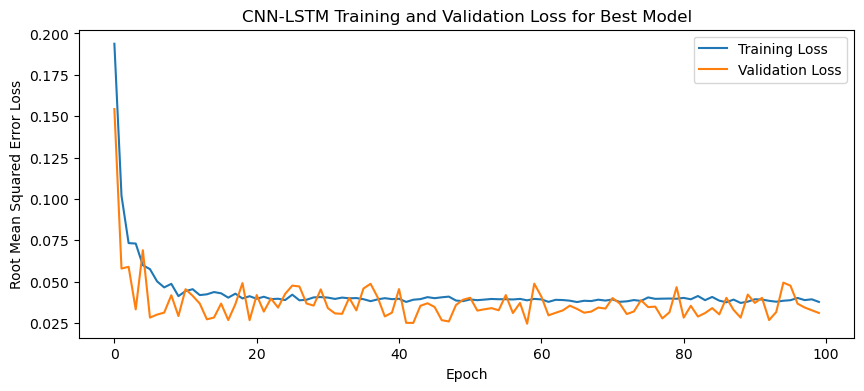

1/1 - 3s - loss: 0.0407 - 3s/epoch - 3s/step
Test Loss: 0.04068910703063011
1/1 [==============================] - 0s 82ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Specific Humidity\tPredicted Specific Humidity\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

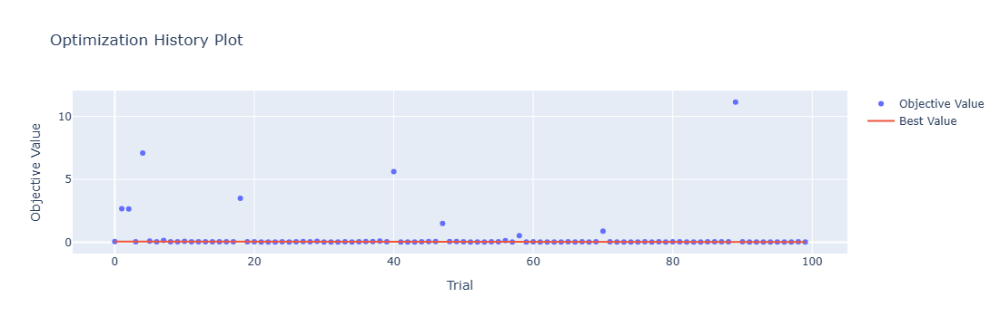

In [4]:
optuna.visualization.plot_optimization_history(study)

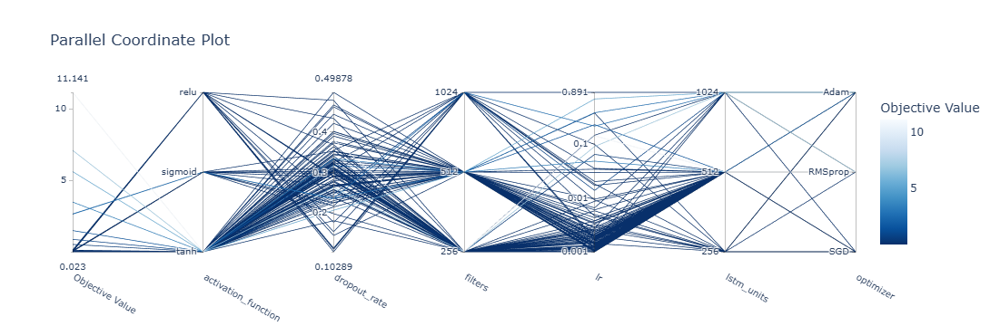

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

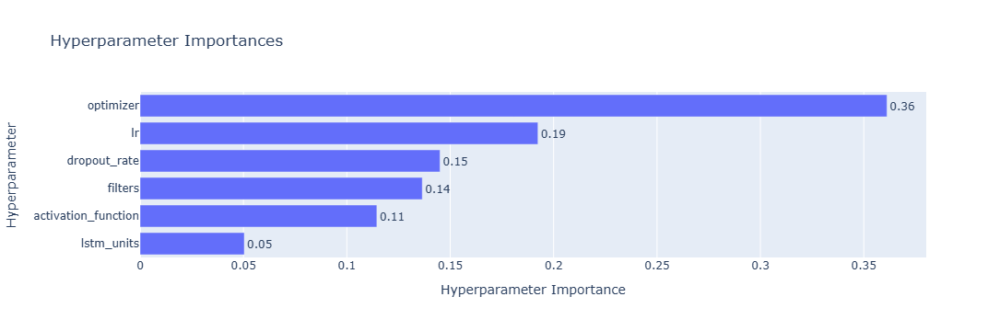

In [6]:
optuna.visualization.plot_param_importances(study)

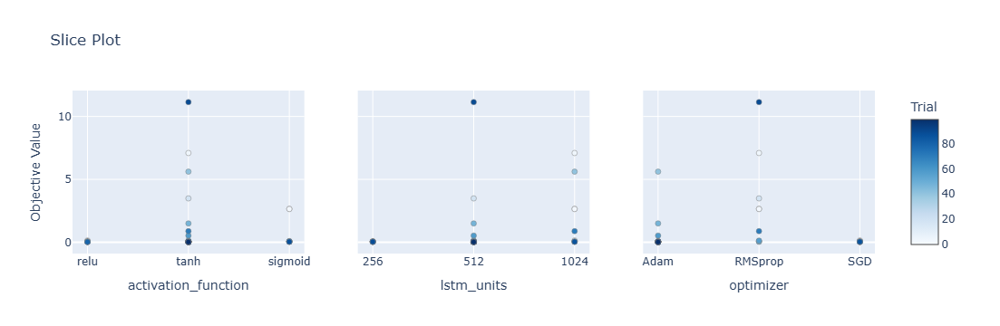

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

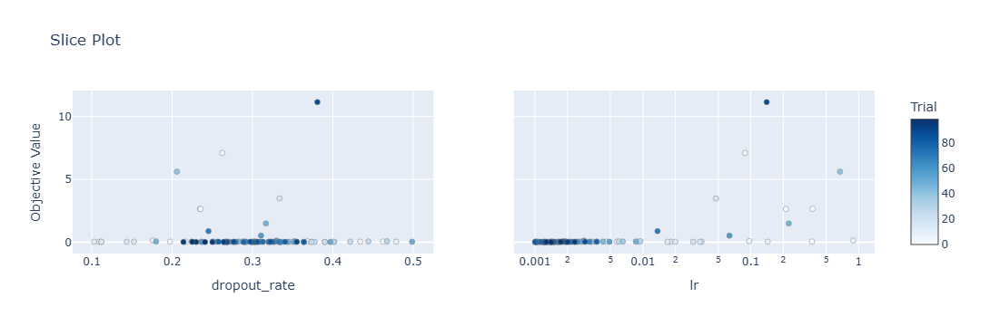

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[ 5.39  4.3   6.51 ... 13.73  8.35  9.05]
 [ 8.03  6.78  8.21 ... 17.14 11.74 12.27]
 [ 5.48  4.27  5.49 ... 13.3   9.17  8.6 ]
 ...
 [ 4.55  3.1   4.22 ... 12.8   7.91  6.65]
 [ 4.44  3.4   5.39 ... 12.34  7.74  6.78]
 [ 4.14  2.75  4.12 ... 10.6   7.07  6.41]]
Epoch 1/100
84/84 [==============================] - 32s 200ms/step - loss: 0.2209 - accuracy: 0.4881 - mae: 0.1981 - rmse: 0.2209 - mape: 37.8366 - pearson: 0.5220 - val_loss: 0.1082 - val_accuracy: 0.9000 - val_mae: 0.0930 - val_rmse: 0.1082 - val_mape: 18.0821 - val_pearson: 0.7750
Epoch 2/100
84/84 [==============================] - 15s 180ms/step - loss: 0.0999 - accuracy: 0.6548 - mae: 0.0870 - rmse: 0.0999 - mape: 16.7581 - pearson: 0.5839 - val_loss: 0.0275 - val_accuracy: 0.9000 - val_mae: 0.0235 - val_rmse: 0.0275 - val_mape: 4.4839 - val_pearson: 0.8080
Epoch 3/100
84/84 [==============================] - 13s 156ms/step - loss: 0.0706 - accuracy: 0.7500 - mae: 0.0617 - rmse: 0.0706 - mape: 11.5928 - pearson: 0.6991 

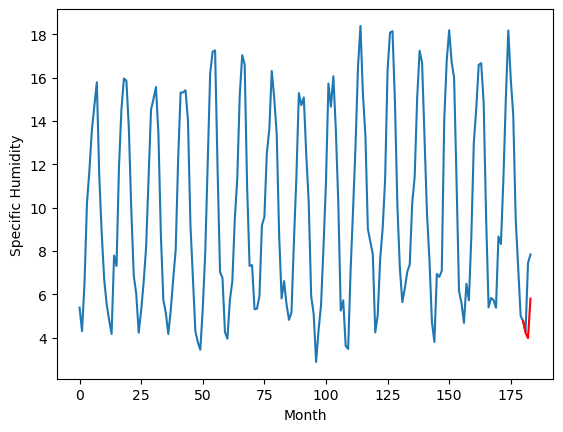

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.74		5.47		-0.27
6.45		5.23		-1.22
8.66		7.05		-1.61
[180, 181, 182, 183]
[7.05, 5.47432549983263, 5.226695872247219, 7.050283409059047]


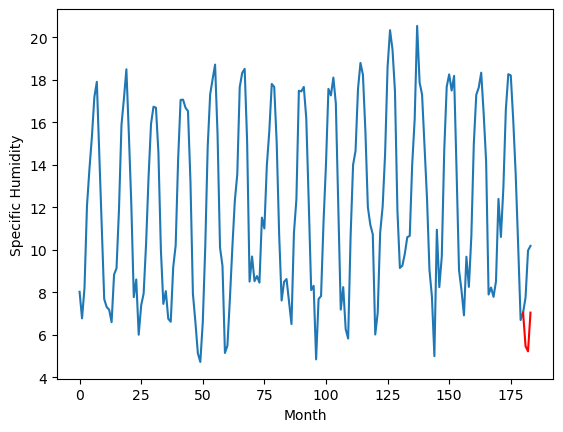

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.41		8.11		-0.30
8.56		7.87		-0.69
10.41		9.69		-0.72
[180, 181, 182, 183]
[5.06, 8.11432549983263, 7.8666958722472184, 9.690284362733363]


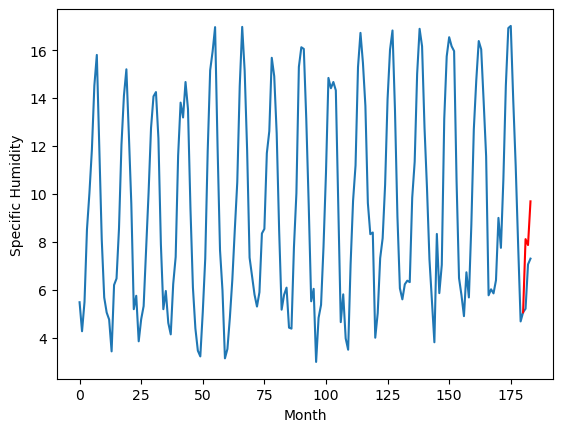

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.55		5.56		0.01
5.46		5.32		-0.14
8.91		7.14		-1.77
[180, 181, 182, 183]
[7.05, 5.564325499832631, 5.3166958722472195, 7.1402843627333645]


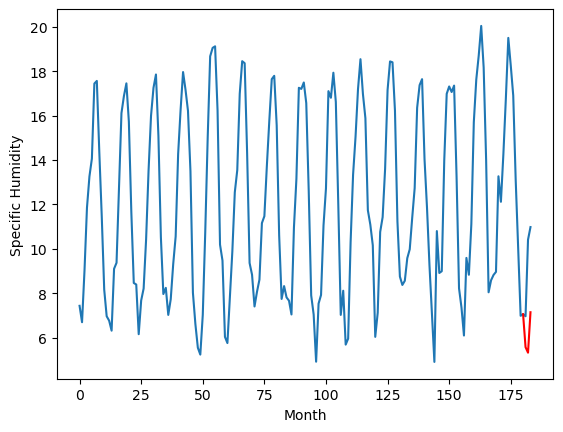

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.36		7.51		0.15
6.96		7.27		0.31
9.80		9.09		-0.71
[180, 181, 182, 183]
[5.2, 7.51432549983263, 7.266695872247219, 9.090286270081997]


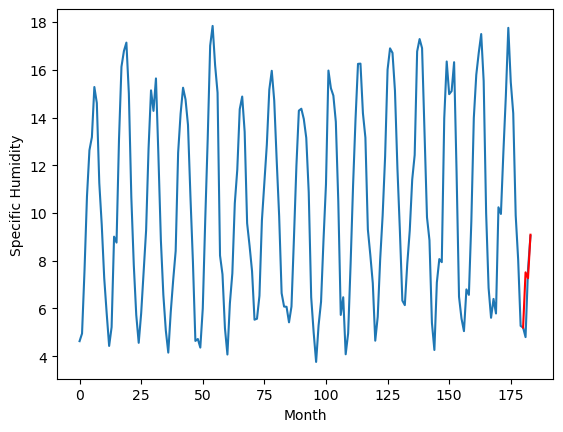

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.02		4.71		0.69
4.61		4.47		-0.14
6.18		6.29		0.11
[180, 181, 182, 183]
[5.16, 4.714326468408108, 4.466696840822697, 6.290286284983158]


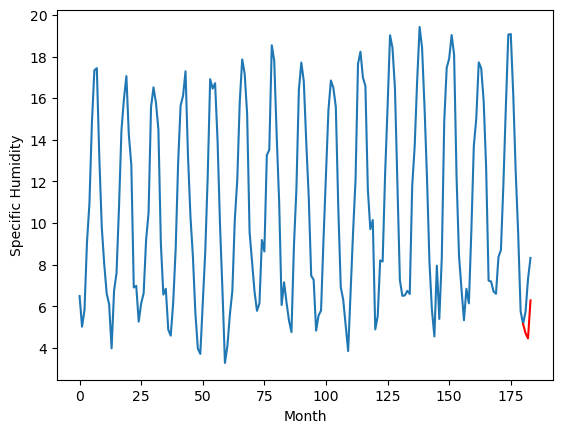

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.35		6.58		0.23
6.40		6.34		-0.06
7.99		8.16		0.17
[180, 181, 182, 183]
[4.05, 6.584326468408108, 6.336697317659855, 8.160284854471684]


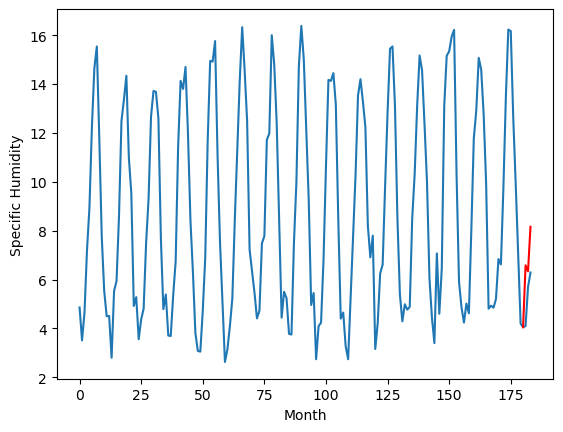

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.55		4.94		0.39
4.58		4.70		0.12
6.20		6.52		0.32
[180, 181, 182, 183]
[3.64, 4.9443254998326305, 4.696695872247219, 6.520284362733364]


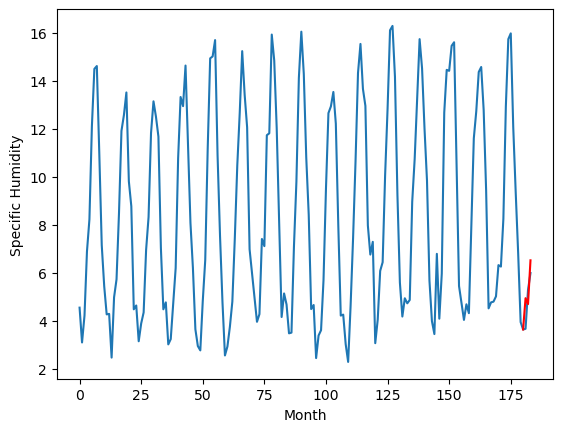

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.32		4.63		0.31
3.64		4.39		0.75
6.70		6.21		-0.49
[180, 181, 182, 183]
[3.46, 4.634326468408108, 4.386696349084377, 6.2102857932448385]


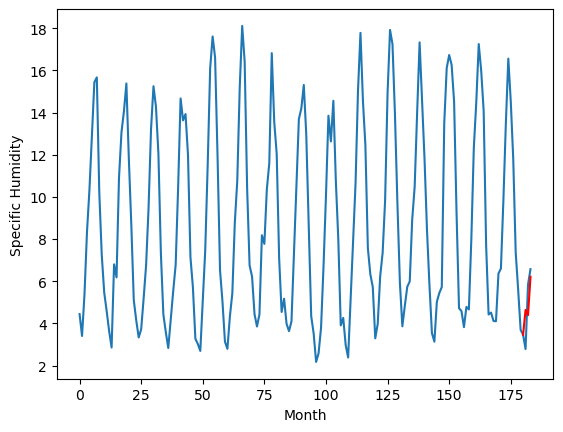

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.11		4.52		0.41
3.66		4.28		0.62
5.46		6.10		0.64
[180, 181, 182, 183]
[2.93, 4.5243254998326305, 4.2766958722472195, 6.100285316407681]


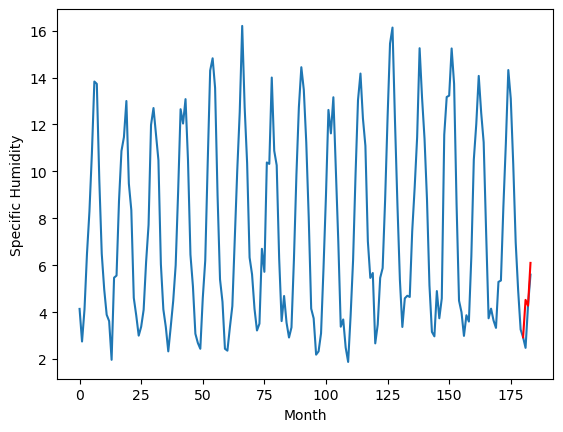

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.76		4.22		0.46
3.02		3.98		0.96
4.64		5.80		1.16
[180, 181, 182, 183]
[2.74, 4.22432549983263, 3.9766953805088994, 5.800284824669361]


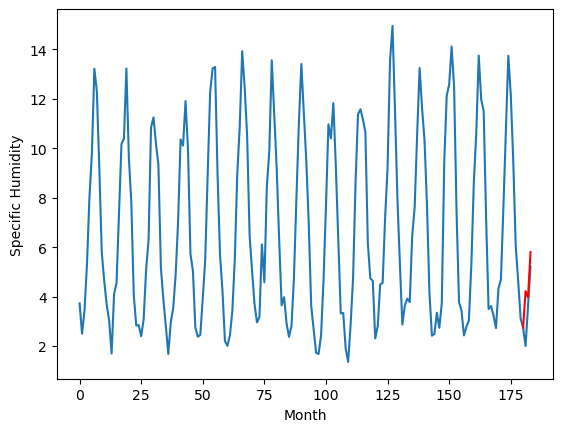

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.90   4.224326
1                 1    5.74   5.474325
2                 2    8.41   8.114325
3                 3    5.55   5.564325
4                 4    7.36   7.514325
5                 5    4.02   4.714326
6                 6    6.35   6.584326
7                 7    4.55   4.944325
8                 8    4.32   4.634326
9                 9    4.11   4.524325
10               10    3.76   4.224325


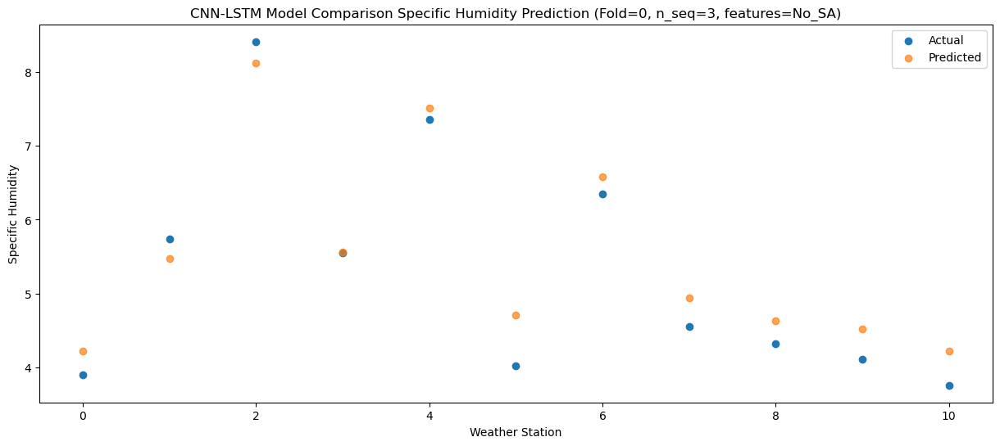

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.41   3.976696
1                 1    6.45   5.226696
2                 2    8.56   7.866696
3                 3    5.46   5.316696
4                 4    6.96   7.266696
5                 5    4.61   4.466697
6                 6    6.40   6.336697
7                 7    4.58   4.696696
8                 8    3.64   4.386696
9                 9    3.66   4.276696
10               10    3.02   3.976695


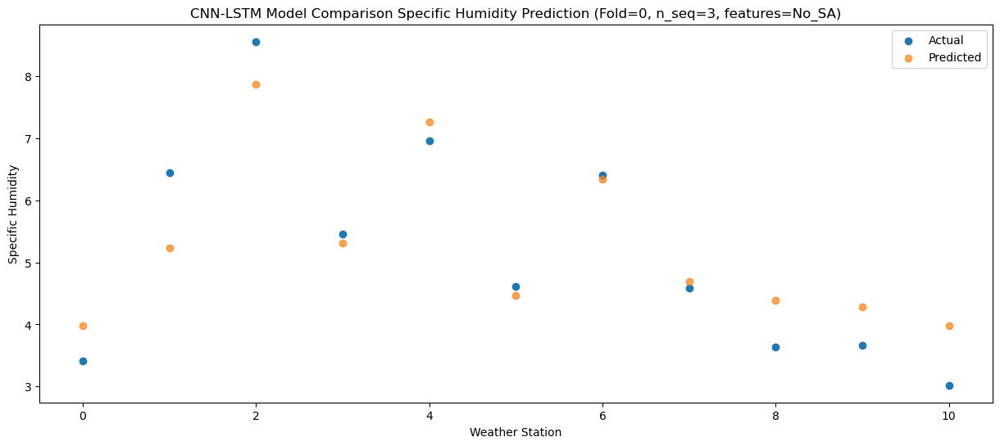

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.58   5.800286
1                 1    8.66   7.050283
2                 2   10.41   9.690284
3                 3    8.91   7.140284
4                 4    9.80   9.090286
5                 5    6.18   6.290286
6                 6    7.99   8.160285
7                 7    6.20   6.520284
8                 8    6.70   6.210286
9                 9    5.46   6.100285
10               10    4.64   5.800285


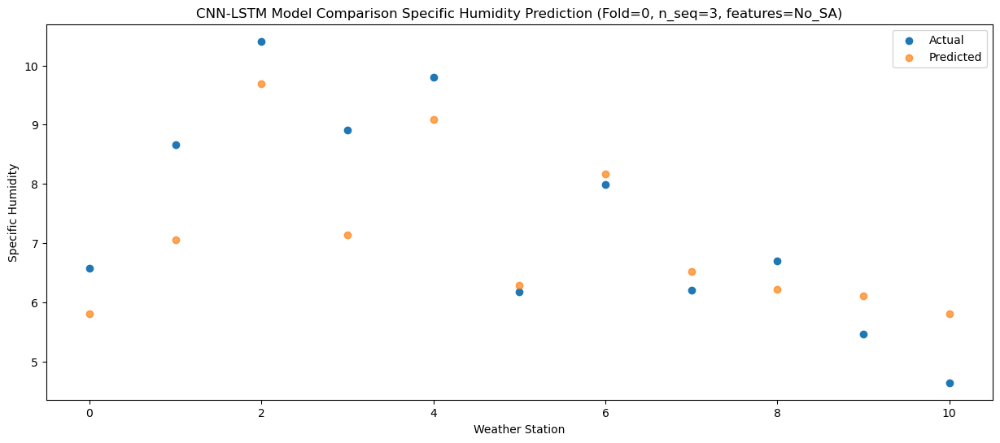

f, t:
[[ 3.9   5.74  8.41  5.55  7.36  4.02  6.35  4.55  4.32  4.11  3.76]
 [ 3.41  6.45  8.56  5.46  6.96  4.61  6.4   4.58  3.64  3.66  3.02]
 [ 6.58  8.66 10.41  8.91  9.8   6.18  7.99  6.2   6.7   5.46  4.64]]
[[4.22432647 5.4743255  8.1143255  5.5643255  7.5143255  4.71432647
  6.58432647 4.9443255  4.63432647 4.5243255  4.2243255 ]
 [3.97669635 5.22669587 7.86669587 5.31669587 7.26669587 4.46669684
  6.33669732 4.69669587 4.38669635 4.27669587 3.97669538]
 [5.80028579 7.05028341 9.69028436 7.14028436 9.09028627 6.29028628
  8.16028485 6.52028436 6.21028579 6.10028532 5.80028482]]
Year at t+1:
t+1 SKRMSE: 0.365037
t+1 KRMSE: 0.365037
t+1 MAE: 0.324571
t+1 SKMAPE: 0.071045
t+1 R2_SCORE: 0.939377
t+1 KMAPE: 0.071045
t+1 PEARSON: 0.978093
t+1 AVERAGE ACTUAL: 5.279091
Year at t+2:
t+2 SKRMSE: 0.625531
t+2 KRMSE: 0.625531
t+2 MAE: 0.506972
t+2 SKMAPE: 0.114911
t+2 R2_SCORE: 0.860855
t+2 KMAPE: 0.114911
t+2 PEARSON: 0.898701
t+2 AVERAGE ACTUAL: 5.159091
Year at t+3:
t+3 SKRMSE: 0.928954

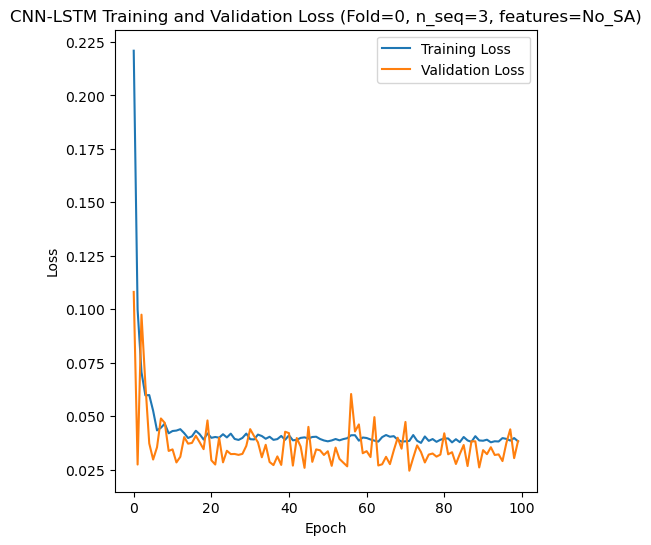

[[ 6.43  5.26  5.95 ... 15.04 10.09  9.76]
 [ 4.92  3.81  4.91 ... 12.52  8.69  7.9 ]
 [ 5.77  4.38  5.81 ... 14.28  9.78  9.52]
 ...
 [ 4.32  3.52  5.54 ... 12.    6.96  7.01]
 [ 3.07  3.12  5.08 ... 11.47  8.11  7.14]
 [ 2.37  2.06  3.5  ...  9.32  6.33  5.39]]
Epoch 1/100
84/84 [==============================] - 42s 249ms/step - loss: 0.1857 - accuracy: 0.6310 - mae: 0.1675 - rmse: 0.1857 - mape: 32.1888 - pearson: 0.5228 - val_loss: 0.0636 - val_accuracy: 0.9000 - val_mae: 0.0524 - val_rmse: 0.0636 - val_mape: 10.6247 - val_pearson: 0.7139
Epoch 2/100
84/84 [==============================] - 14s 171ms/step - loss: 0.0889 - accuracy: 0.6548 - mae: 0.0763 - rmse: 0.0889 - mape: 14.5144 - pearson: 0.6858 - val_loss: 0.0521 - val_accuracy: 0.9000 - val_mae: 0.0445 - val_rmse: 0.0521 - val_mape: 8.7260 - val_pearson: 0.9027
Epoch 3/100
84/84 [==============================] - 14s 172ms/step - loss: 0.0792 - accuracy: 0.7976 - mae: 0.0694 - rmse: 0.0792 - mape: 13.0938 - pearson: 0.7331 

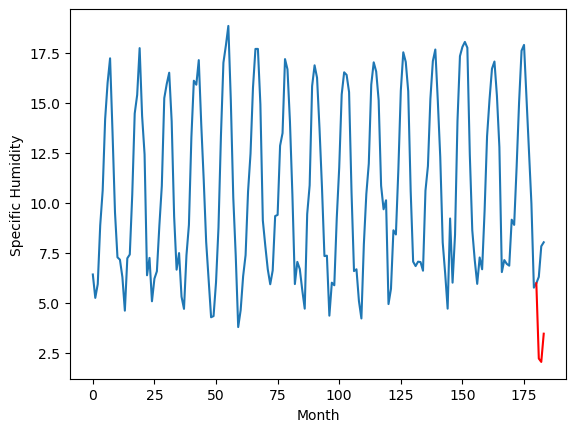

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.45		6.29		-0.16
6.64		6.12		-0.52
8.17		7.53		-0.64
[180, 181, 182, 183]
[4.15, 6.28575184226036, 6.11686993420124, 7.529022701382637]


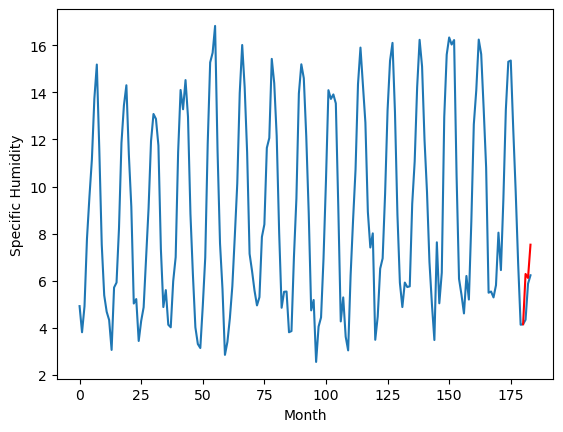

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.78		-0.29
5.07		4.61		-0.46
7.69		6.02		-1.67
[180, 181, 182, 183]
[5.12, 4.775753779411316, 4.606871871352196, 6.019024638533592]


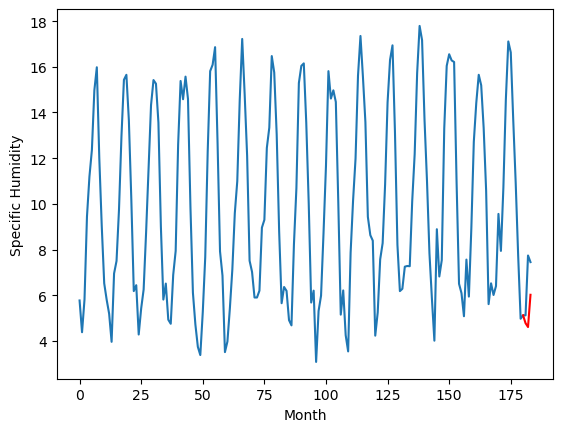

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.43		5.63		0.20
5.50		5.46		-0.04
8.14		6.87		-1.27
[180, 181, 182, 183]
[6.35, 5.625752810835838, 5.456868980526924, 6.86902174770832]


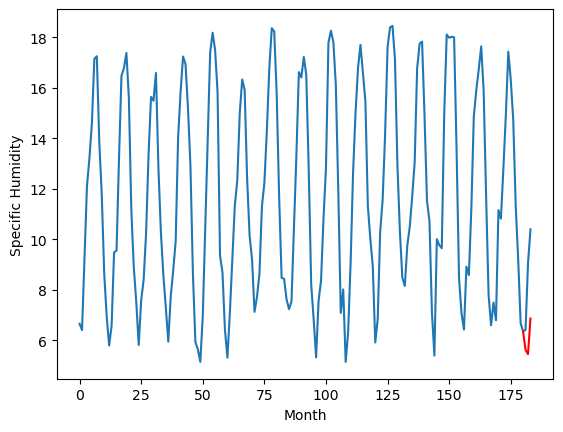

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.41		6.52		0.11
6.45		6.35		-0.10
9.17		7.76		-1.41
[180, 181, 182, 183]
[6.08, 6.5157528108358385, 6.346868980526924, 7.759021747708321]


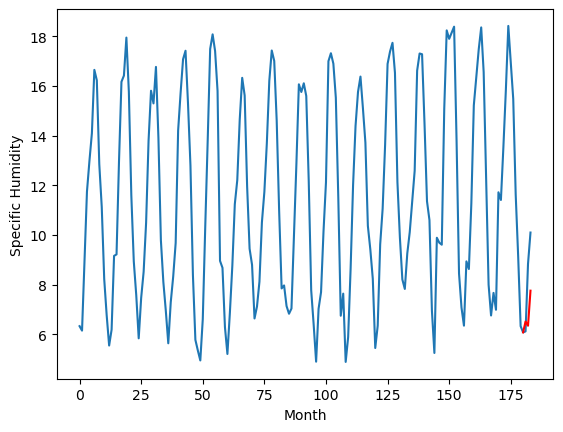

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.16		6.19		-0.97
6.53		6.02		-0.51
7.32		7.43		0.11
[180, 181, 182, 183]
[3.92, 6.185752810835838, 6.016869949102402, 7.429021762609482]


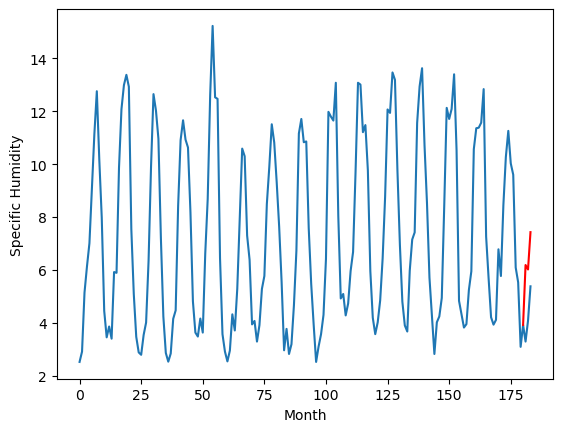

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.41		2.38		-0.03
2.53		2.21		-0.32
4.09		3.62		-0.47
[180, 181, 182, 183]
[4.16, 2.3757528108358383, 2.2068718713521958, 3.6190246385335922]


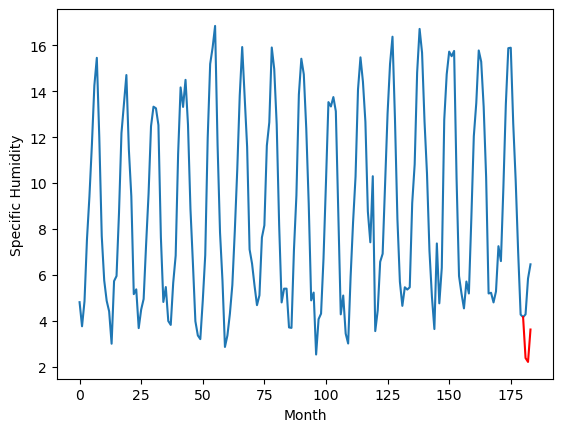

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.68		4.67		-0.01
4.16		4.50		0.34
6.89		5.91		-0.98
[180, 181, 182, 183]
[3.84, 4.66575184226036, 4.49686993420124, 5.909022701382637]


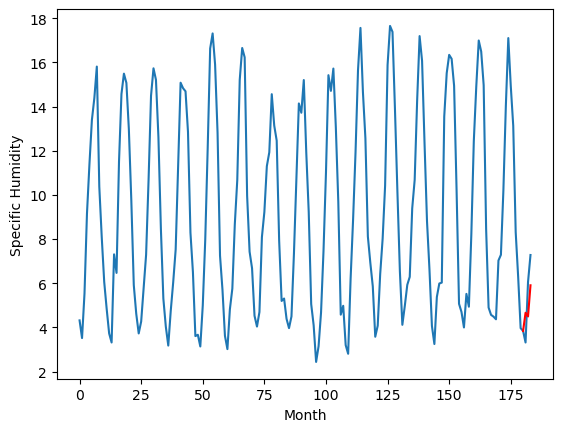

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.18		-0.30
3.67		4.01		0.34
6.28		5.42		-0.86
[180, 181, 182, 183]
[3.73, 4.175751842260361, 4.006868980526924, 5.419021747708321]


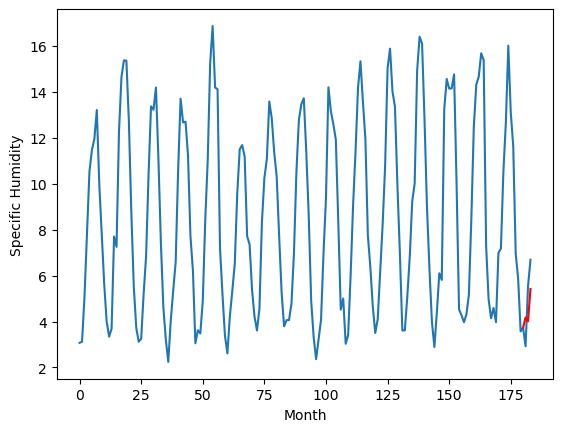

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.26		2.93		-0.33
2.52		2.76		0.24
4.34		4.17		-0.17
[180, 181, 182, 183]
[2.83, 2.9257518422603606, 2.756868980526924, 4.1690207940340045]


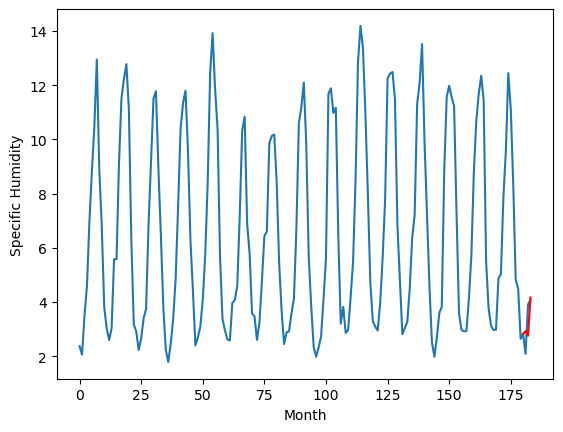

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.64		2.23		0.59
1.68		2.06		0.38
2.92		3.47		0.55
[180, 181, 182, 183]
[2.69, 2.2257547330856324, 2.0568776679039003, 3.469034368991852]


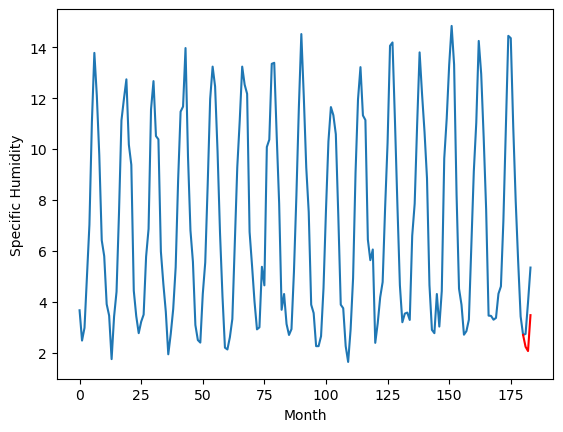

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.59   2.225752
1                 1    6.45   6.285752
2                 2    5.07   4.775754
3                 3    5.43   5.625753
4                 4    6.41   6.515753
5                 5    7.16   6.185753
6                 6    2.41   2.375753
7                 7    4.68   4.665752
8                 8    4.48   4.175752
9                 9    3.26   2.925752
10               10    1.64   2.225755


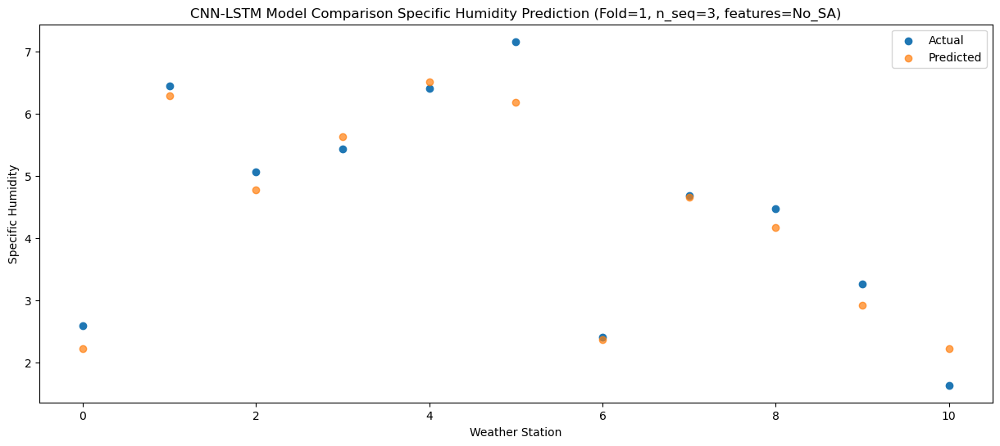

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.91   2.056871
1                 1    6.64   6.116870
2                 2    5.07   4.606872
3                 3    5.50   5.456869
4                 4    6.45   6.346869
5                 5    6.53   6.016870
6                 6    2.53   2.206872
7                 7    4.16   4.496870
8                 8    3.67   4.006869
9                 9    2.52   2.756869
10               10    1.68   2.056878


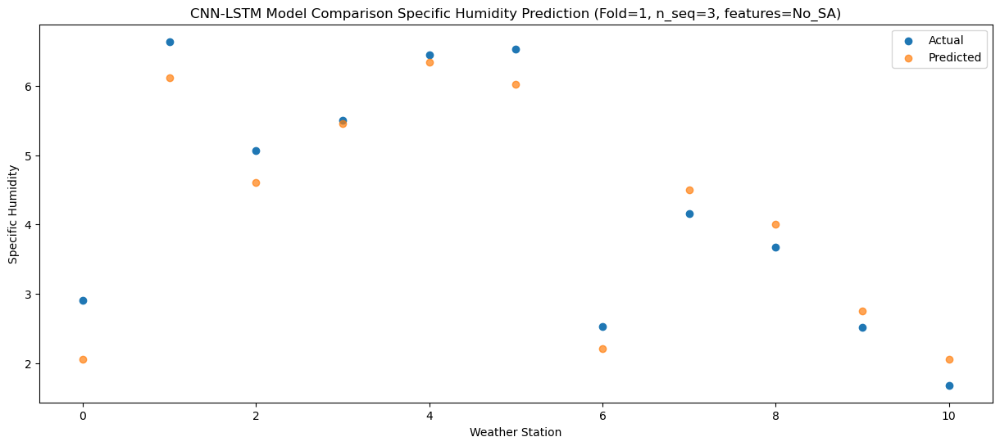

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    4.44   3.469025
1                 1    8.17   7.529023
2                 2    7.69   6.019025
3                 3    8.14   6.869022
4                 4    9.17   7.759022
5                 5    7.32   7.429022
6                 6    4.09   3.619025
7                 7    6.89   5.909023
8                 8    6.28   5.419022
9                 9    4.34   4.169021
10               10    2.92   3.469034


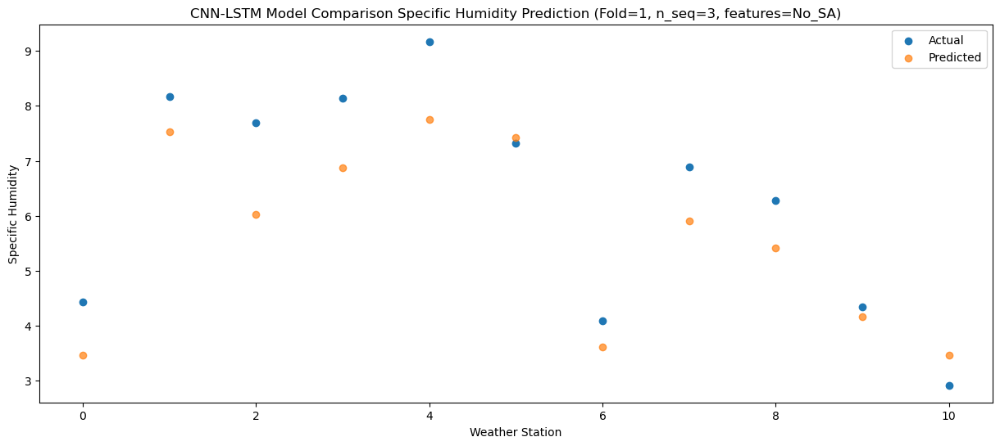

f, t:
[[2.59 6.45 5.07 5.43 6.41 7.16 2.41 4.68 4.48 3.26 1.64]
 [2.91 6.64 5.07 5.5  6.45 6.53 2.53 4.16 3.67 2.52 1.68]
 [4.44 8.17 7.69 8.14 9.17 7.32 4.09 6.89 6.28 4.34 2.92]]
[[2.22575184 6.28575184 4.77575378 5.62575281 6.51575281 6.18575281
  2.37575281 4.66575184 4.17575184 2.92575184 2.22575473]
 [2.0568709  6.11686993 4.60687187 5.45686898 6.34686898 6.01686995
  2.20687187 4.49686993 4.00686898 2.75686898 2.05687767]
 [3.46902462 7.5290227  6.01902464 6.86902175 7.75902175 7.42902176
  3.61902464 5.9090227  5.41902175 4.16902079 3.46903437]]
Year at t+1:
t+1 SKRMSE: 0.403808
t+1 KRMSE: 0.403808
t+1 MAE: 0.306477
t+1 SKMAPE: 0.087056
t+1 R2_SCORE: 0.946428
t+1 KMAPE: 0.087056
t+1 PEARSON: 0.956055
t+1 AVERAGE ACTUAL: 4.507273
Year at t+2:
t+2 SKRMSE: 0.428666
t+2 KRMSE: 0.428666
t+2 MAE: 0.373581
t+2 SKMAPE: 0.107684
t+2 R2_SCORE: 0.938009
t+2 KMAPE: 0.107684
t+2 PEARSON: 0.945756
t+2 AVERAGE ACTUAL: 4.332727
Year at t+3:
t+3 SKRMSE: 0.954417
t+3 KRMSE: 0.954417
t+3 MAE: 0.8

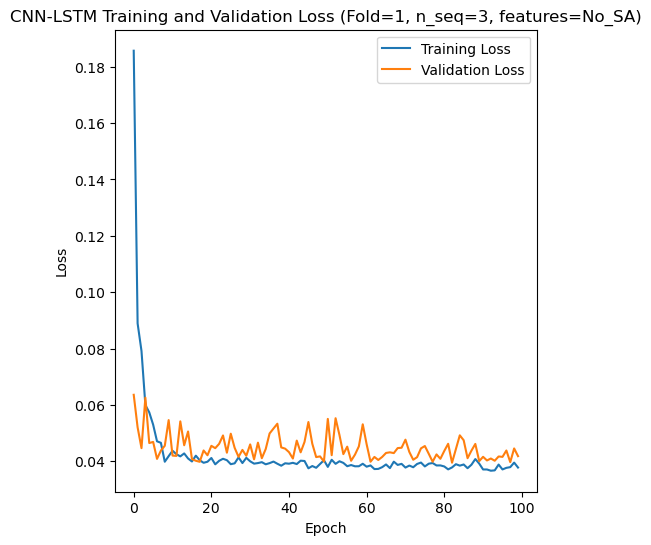

[[ 4.97  3.84  5.83 ... 12.86  8.48  8.25]
 [ 2.46  2.06  3.48 ...  9.57  6.71  5.1 ]
 [ 8.78  8.15  9.01 ... 20.36 15.38 12.95]
 ...
 [ 1.89  2.51  2.73 ...  7.42  4.53  3.35]
 [ 5.04  4.9   5.93 ... 10.09  8.19  4.88]
 [ 5.06  3.79  4.84 ... 13.58  8.96  7.8 ]]
Epoch 1/100
84/84 [==============================] - 43s 236ms/step - loss: 0.1883 - accuracy: 0.4643 - mae: 0.1656 - rmse: 0.1883 - mape: 31.3630 - pearson: 0.5355 - val_loss: 0.1212 - val_accuracy: 0.0000e+00 - val_mae: 0.1019 - val_rmse: 0.1212 - val_mape: 18.4263 - val_pearson: 0.0712
Epoch 2/100
84/84 [==============================] - 13s 155ms/step - loss: 0.1046 - accuracy: 0.6667 - mae: 0.0942 - rmse: 0.1046 - mape: 17.7738 - pearson: 0.6488 - val_loss: 0.0616 - val_accuracy: 1.0000 - val_mae: 0.0547 - val_rmse: 0.0616 - val_mape: 10.9133 - val_pearson: 0.9228
Epoch 3/100
84/84 [==============================] - 13s 157ms/step - loss: 0.0649 - accuracy: 0.7857 - mae: 0.0556 - rmse: 0.0649 - mape: 10.5674 - pearson: 0.

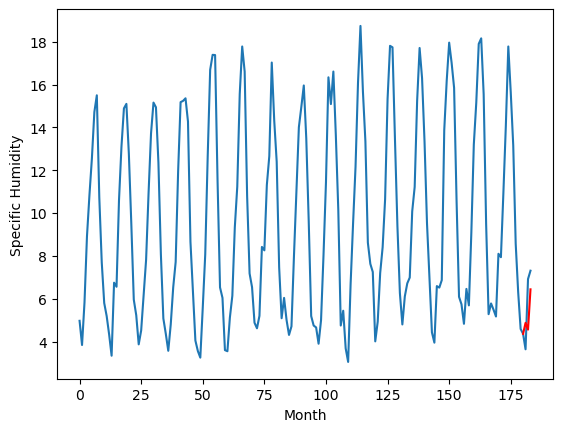

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		4.78		-0.14
4.24		4.47		0.23
6.09		6.35		0.26
[180, 181, 182, 183]
[2.82, 4.784282119274139, 4.467131377458572, 6.348971964120865]


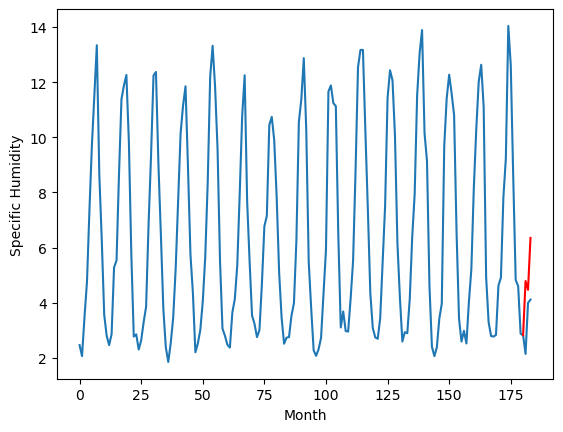

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.95		2.27		-0.68
5.08		1.96		-3.12
5.30		3.84		-1.46
[180, 181, 182, 183]
[9.16, 2.2742821192741394, 1.957130423784256, 3.8389729177951812]


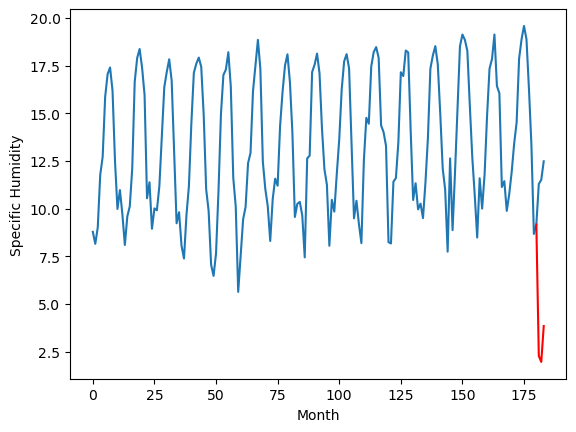

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.70		8.59		0.89
7.87		8.28		0.41
8.51		10.16		1.65
[180, 181, 182, 183]
[2.44, 8.594284980297088, 8.277139513492584, 10.158980100154876]


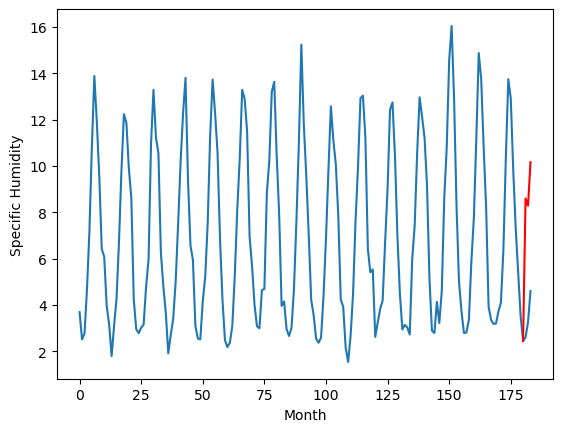

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.82		3.50		-0.32
3.80		3.19		-0.61
7.09		5.07		-2.02
[180, 181, 182, 183]
[6.65, 3.504279243350029, 3.1871237033605575, 5.0689642900228495]


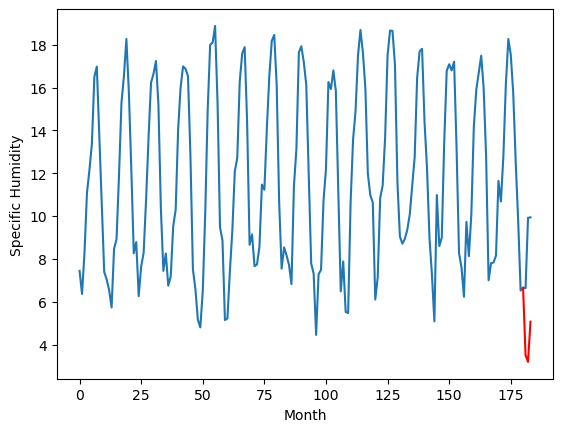

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.31		7.25		-0.06
7.26		6.94		-0.32
10.25		8.82		-1.43
[180, 181, 182, 183]
[6.19, 7.254279720187188, 6.937124180197716, 8.818966674208642]


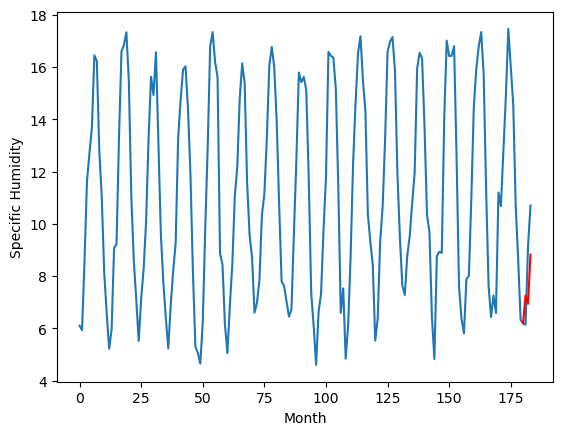

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.00		5.91		-0.09
5.67		5.60		-0.07
8.53		7.48		-1.05
[180, 181, 182, 183]
[4.78, 5.914279243350029, 5.597124180197715, 7.478966674208641]


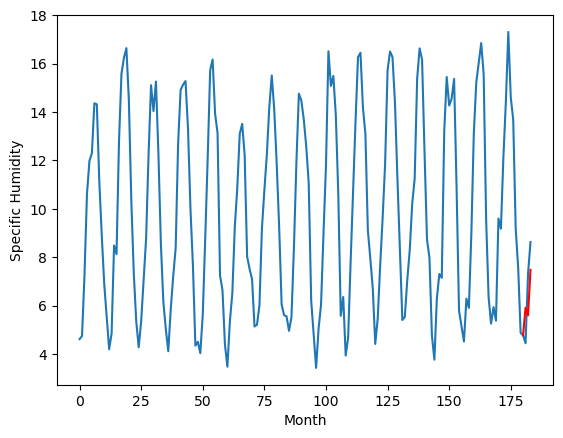

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.43		-0.47
4.77		4.12		-0.65
4.86		6.00		1.14
[180, 181, 182, 183]
[2.61, 4.434284026622772, 4.117134238481522, 5.998974825143814]


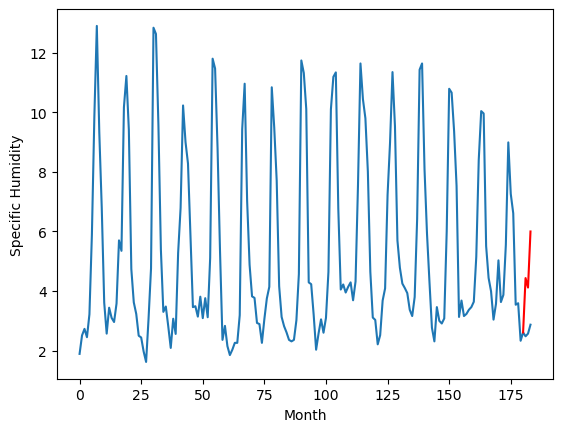

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.74		1.70		-1.04
3.27		1.39		-1.88
3.38		3.27		-0.11
[180, 181, 182, 183]
[4.6, 1.704283549785614, 1.3871385598182677, 3.26897914648056]


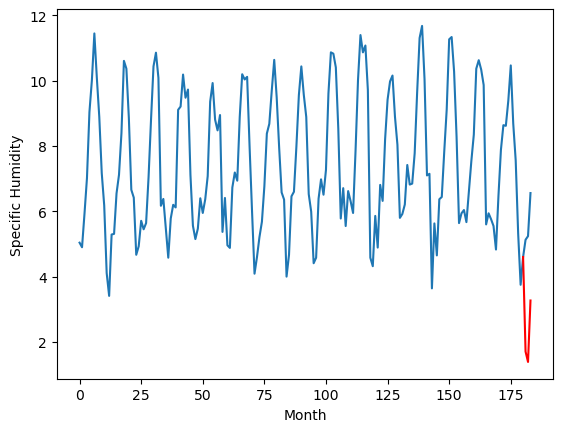

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		4.85		-0.07
4.99		4.54		-0.45
6.72		6.42		-0.30
[180, 181, 182, 183]
[4.27, 4.85428162753582, 4.537127041220665, 6.4189676278829575]


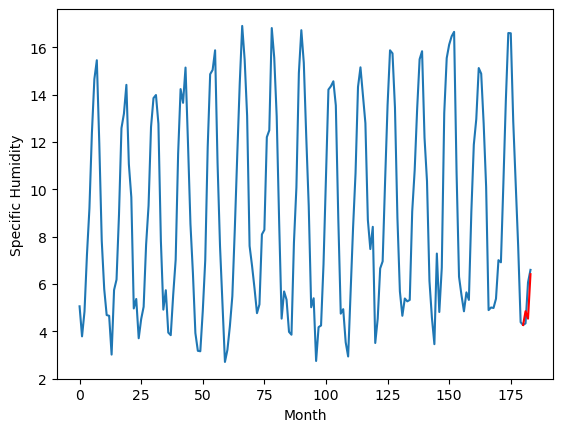

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.87		-0.20
5.31		4.56		-0.75
6.34		6.44		0.10
[180, 181, 182, 183]
[3.91, 4.87428162753582, 4.557129932045936, 6.4389724260568615]


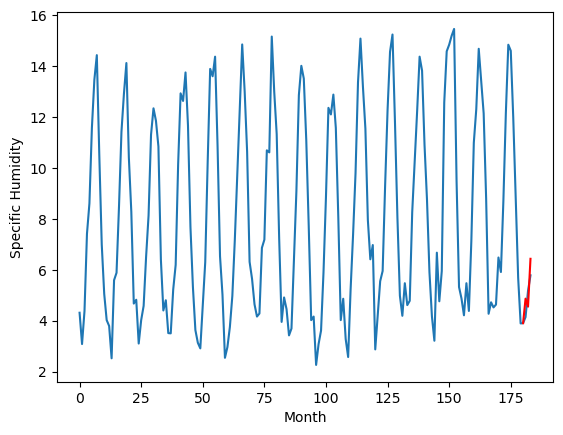

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.83   4.874279
1                 1    4.92   4.784282
2                 2    2.95   2.274282
3                 3    7.70   8.594285
4                 4    3.82   3.504279
5                 5    7.31   7.254280
6                 6    6.00   5.914279
7                 7    4.90   4.434284
8                 8    2.74   1.704284
9                 9    4.92   4.854282
10               10    5.07   4.874282


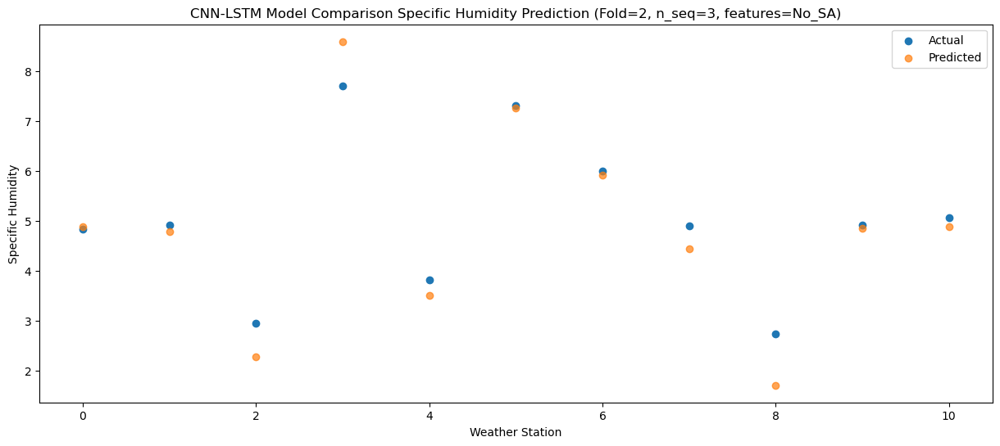

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.11   4.557123
1                 1    4.24   4.467131
2                 2    5.08   1.957130
3                 3    7.87   8.277140
4                 4    3.80   3.187124
5                 5    7.26   6.937124
6                 6    5.67   5.597124
7                 7    4.77   4.117134
8                 8    3.27   1.387139
9                 9    4.99   4.537127
10               10    5.31   4.557130


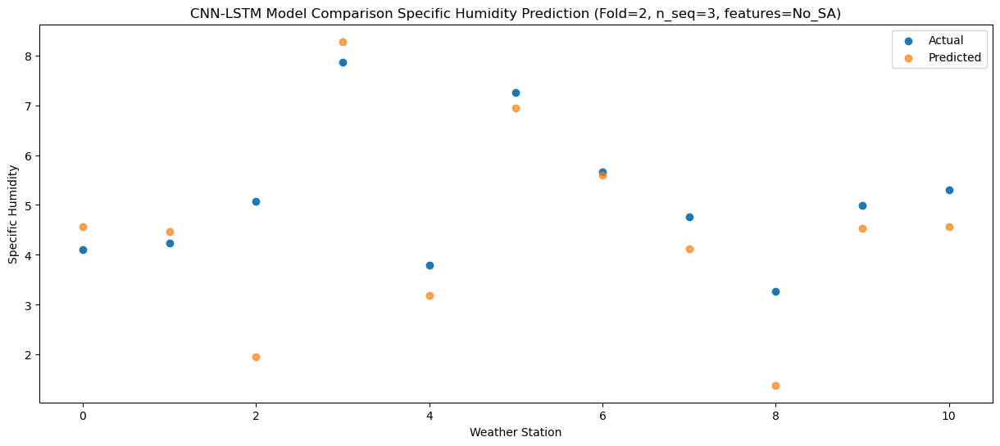

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.39   6.438966
1                 1    6.09   6.348972
2                 2    5.30   3.838973
3                 3    8.51  10.158980
4                 4    7.09   5.068964
5                 5   10.25   8.818967
6                 6    8.53   7.478967
7                 7    4.86   5.998975
8                 8    3.38   3.268979
9                 9    6.72   6.418968
10               10    6.34   6.438972


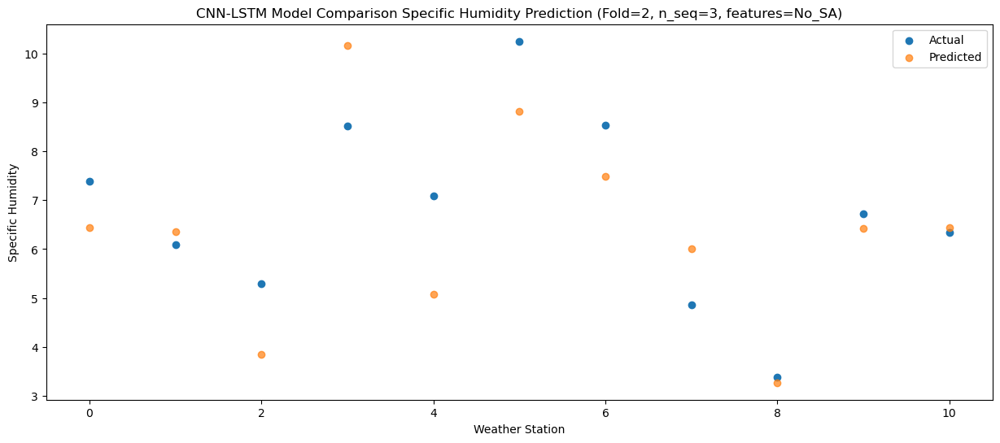

f, t:
[[ 4.83  4.92  2.95  7.7   3.82  7.31  6.    4.9   2.74  4.92  5.07]
 [ 4.11  4.24  5.08  7.87  3.8   7.26  5.67  4.77  3.27  4.99  5.31]
 [ 7.39  6.09  5.3   8.51  7.09 10.25  8.53  4.86  3.38  6.72  6.34]]
[[ 4.87427877  4.78428212  2.27428212  8.59428498  3.50427924  7.25427972
   5.91427924  4.43428403  1.70428355  4.85428163  4.87428163]
 [ 4.55712323  4.46713138  1.95713042  8.27713951  3.1871237   6.93712418
   5.59712418  4.11713424  1.38713856  4.53712704  4.55712993]
 [ 6.43896572  6.34897196  3.83897292 10.1589801   5.06896429  8.81896667
   7.47896667  5.99897483  3.26897915  6.41896763  6.43897243]]
Year at t+1:
t+1 SKRMSE: 0.497181
t+1 KRMSE: 0.497181
t+1 MAE: 0.360912
t+1 SKMAPE: 0.091956
t+1 R2_SCORE: 0.888484
t+1 KMAPE: 0.091956
t+1 PEARSON: 0.983358
t+1 AVERAGE ACTUAL: 5.014545
Year at t+2:
t+2 SKRMSE: 1.183142
t+2 KRMSE: 1.183142
t+2 MAE: 0.814033
t+2 SKMAPE: 0.181150
t+2 R2_SCORE: 0.213617
t+2 KMAPE: 0.181150
t+2 PEARSON: 0.740205
t+2 AVERAGE ACTUAL: 5.124545


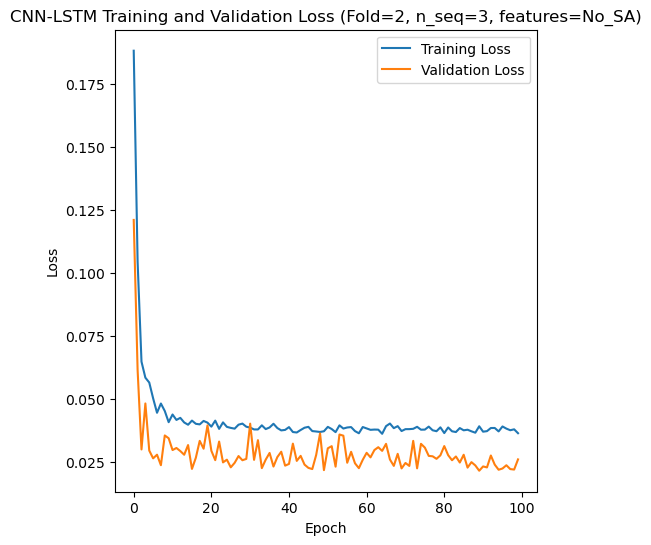

[[ 5.11  3.7   4.74 ... 13.5   8.68  7.66]
 [ 3.73  2.91  5.05 ... 11.19  6.96  6.57]
 [ 5.56  5.41  5.55 ...  8.56  7.45  5.59]
 ...
 [ 2.73  2.21  3.23 ...  5.    3.95  3.09]
 [ 5.93  5.59  5.49 ...  8.63  7.04  6.11]
 [ 3.71  2.55  2.84 ...  9.78  6.68  4.77]]
Epoch 1/100
84/84 [==============================] - 41s 198ms/step - loss: 0.2044 - accuracy: 0.5833 - mae: 0.1815 - rmse: 0.2044 - mape: 34.7932 - pearson: 0.6026 - val_loss: 0.0594 - val_accuracy: 0.8000 - val_mae: 0.0491 - val_rmse: 0.0594 - val_mape: 9.3317 - val_pearson: 0.7761
Epoch 2/100
84/84 [==============================] - 10s 122ms/step - loss: 0.0913 - accuracy: 0.7619 - mae: 0.0812 - rmse: 0.0913 - mape: 15.3045 - pearson: 0.7096 - val_loss: 0.1100 - val_accuracy: 0.8000 - val_mae: 0.0993 - val_rmse: 0.1100 - val_mape: 18.7823 - val_pearson: 0.8475
Epoch 3/100
84/84 [==============================] - 10s 118ms/step - loss: 0.0752 - accuracy: 0.7976 - mae: 0.0650 - rmse: 0.0752 - mape: 12.5135 - pearson: 0.6465 

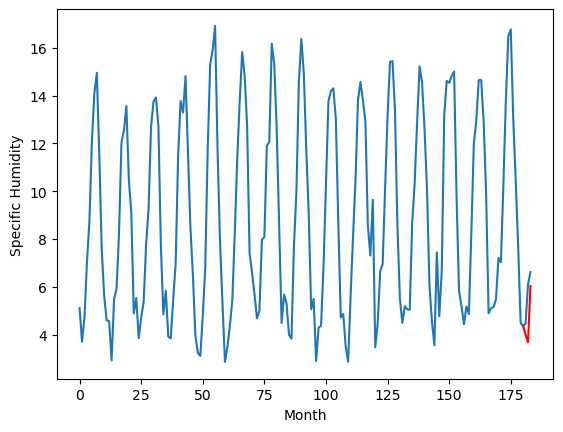

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.02		5.41		0.39
4.46		5.08		0.62
6.97		7.43		0.46
[180, 181, 182, 183]
[3.43, 5.408646807670594, 5.083250269889832, 7.432835087776184]


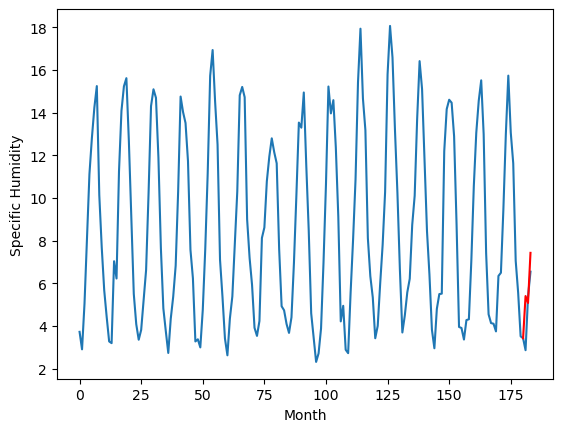

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.17		4.03		-0.14
4.11		3.70		-0.41
4.19		6.05		1.86
[180, 181, 182, 183]
[5.43, 4.028646807670594, 3.7032512235641484, 6.052836041450501]


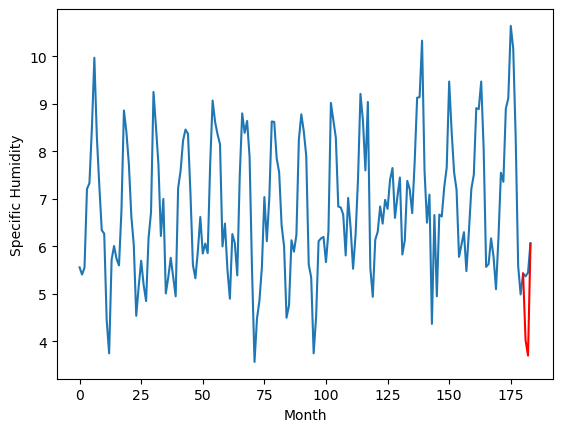

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.29		5.86		0.57
5.22		5.53		0.31
6.52		7.88		1.36
[180, 181, 182, 183]
[3.21, 5.858647761344909, 5.533251700401306, 7.882838425636291]


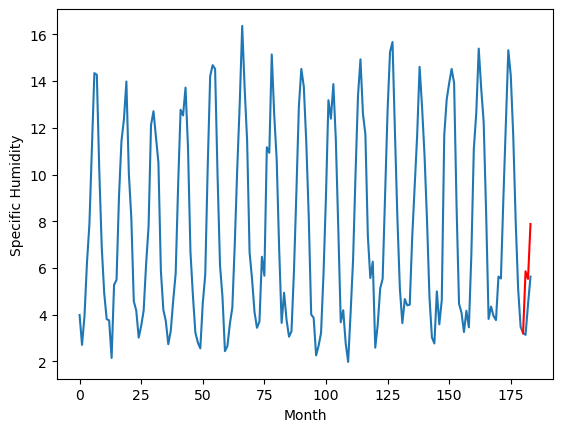

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.79		4.29		0.50
2.96		3.96		1.00
5.44		6.31		0.87
[180, 181, 182, 183]
[3.04, 4.2886468076705935, 3.963252207040787, 6.312837978601456]


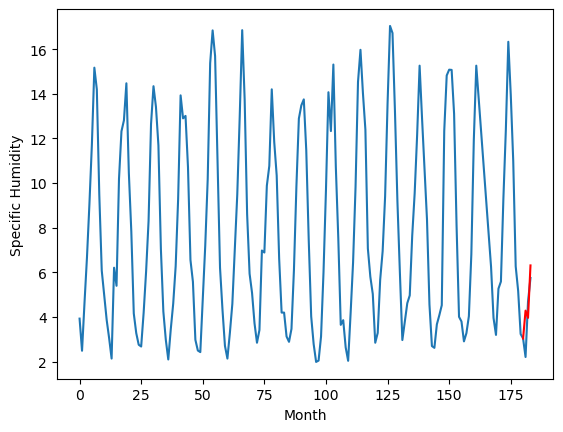

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.62		4.23		0.61
3.10		3.90		0.80
5.13		6.25		1.12
[180, 181, 182, 183]
[2.91, 4.228647761344909, 3.903251700401306, 6.252838425636291]


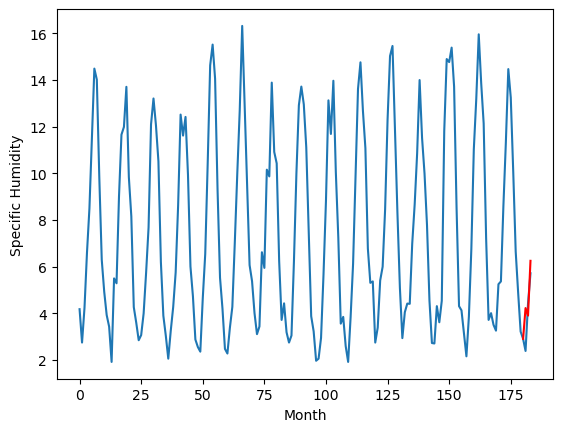

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		4.48		0.13
4.41		4.15		-0.26
4.72		6.50		1.78
[180, 181, 182, 183]
[1.6, 4.478647761344909, 4.153250269889831, 6.502834134101867]


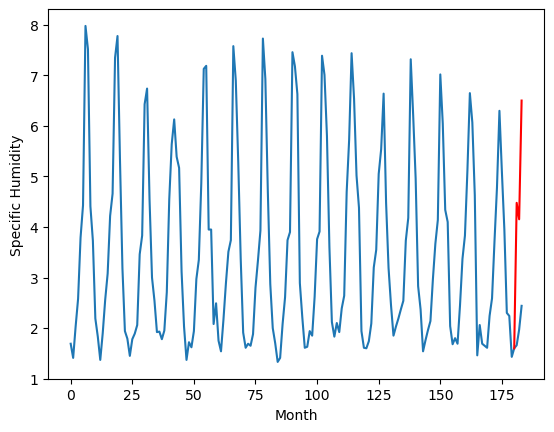

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.50		1.99		-0.51
2.02		1.66		-0.36
2.32		4.01		1.69
[180, 181, 182, 183]
[2.86, 1.9886458241939544, 1.663249763250351, 4.012834581136703]


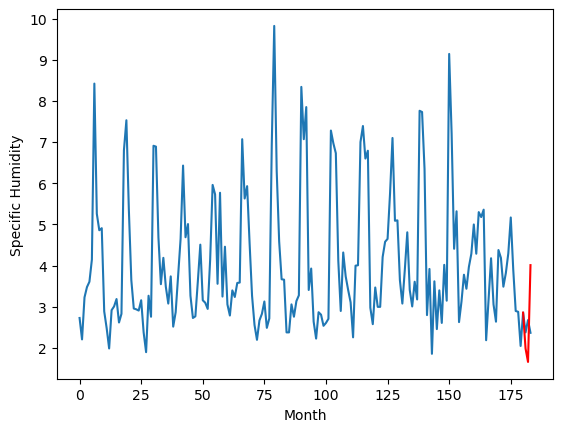

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.40		3.03		-0.37
3.05		2.70		-0.35
2.70		5.05		2.35
[180, 181, 182, 183]
[5.65, 3.0286468076705932, 2.703251223564148, 5.052836041450501]


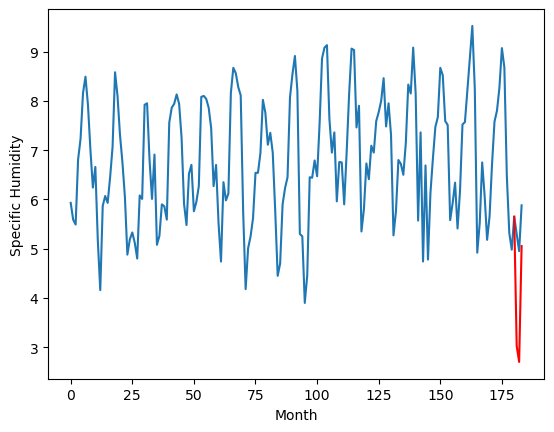

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		6.23		1.39
4.99		5.90		0.91
5.77		8.25		2.48
[180, 181, 182, 183]
[2.54, 6.228647761344909, 5.903253637552261, 8.25283940911293]


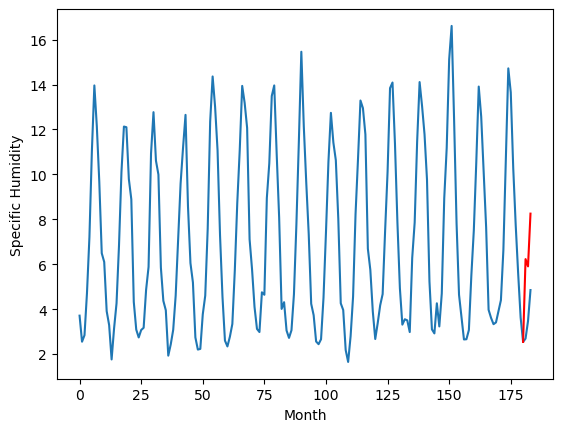

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.02		4.01		0.99
2.88		3.68		0.80
4.16		6.03		1.87
[180, 181, 182, 183]
[2.51, 4.008648744821548, 3.6832536673545837, 6.032840392589569]


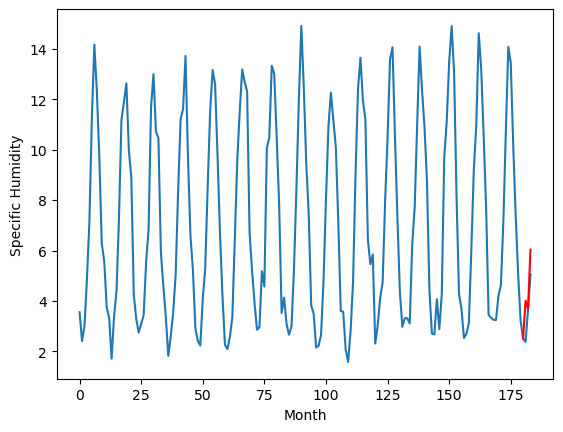

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.58   4.008647
1                 1    5.02   5.408647
2                 2    4.17   4.028647
3                 3    5.29   5.858648
4                 4    3.79   4.288647
5                 5    3.62   4.228648
6                 6    4.35   4.478648
7                 7    2.50   1.988646
8                 8    3.40   3.028647
9                 9    4.84   6.228648
10               10    3.02   4.008649


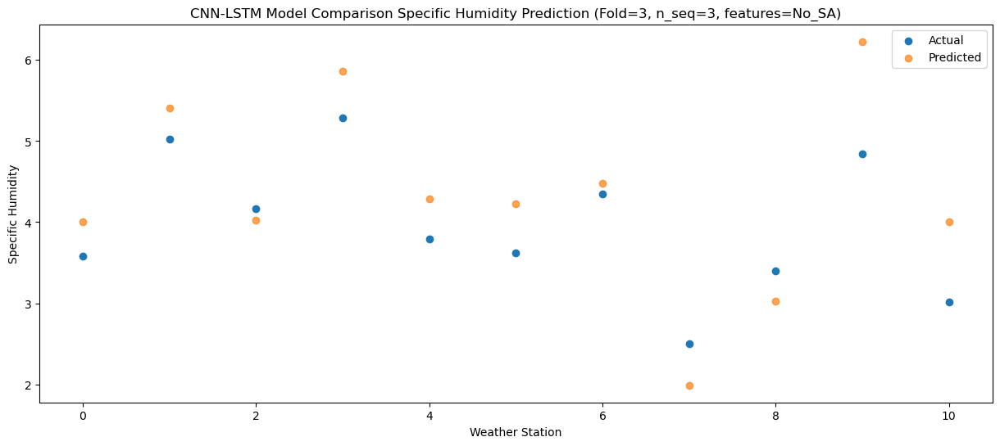

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.683253
1                 1    4.46   5.083250
2                 2    4.11   3.703251
3                 3    5.22   5.533252
4                 4    2.96   3.963252
5                 5    3.10   3.903252
6                 6    4.41   4.153250
7                 7    2.02   1.663250
8                 8    3.05   2.703251
9                 9    4.99   5.903254
10               10    2.88   3.683254


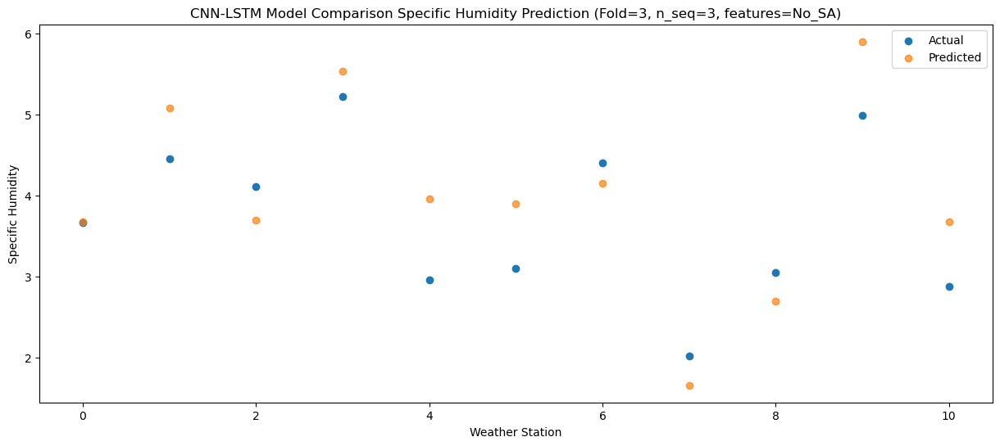

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.32   6.032840
1                 1    6.97   7.432835
2                 2    4.19   6.052836
3                 3    6.52   7.882838
4                 4    5.44   6.312838
5                 5    5.13   6.252838
6                 6    4.72   6.502834
7                 7    2.32   4.012835
8                 8    2.70   5.052836
9                 9    5.77   8.252839
10               10    4.16   6.032840


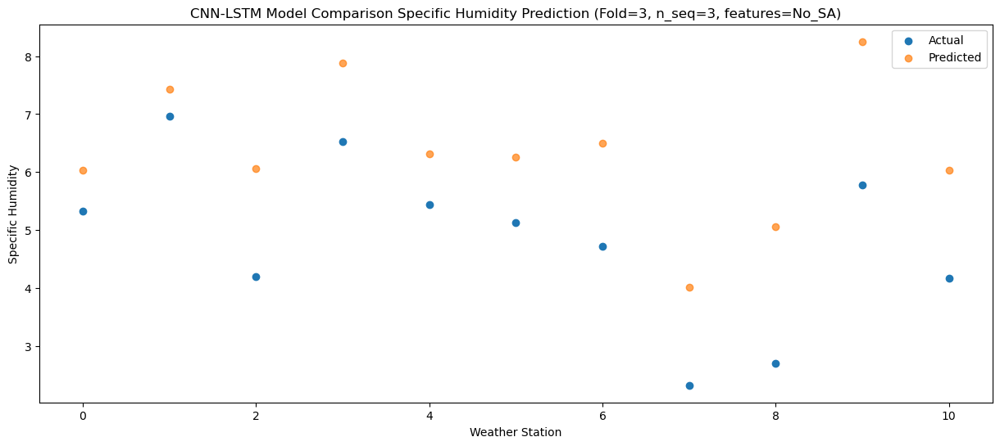

f, t:
[[3.58 5.02 4.17 5.29 3.79 3.62 4.35 2.5  3.4  4.84 3.02]
 [3.67 4.46 4.11 5.22 2.96 3.1  4.41 2.02 3.05 4.99 2.88]
 [5.32 6.97 4.19 6.52 5.44 5.13 4.72 2.32 2.7  5.77 4.16]]
[[4.00864681 5.40864681 4.02864681 5.85864776 4.28864681 4.22864776
  4.47864776 1.98864582 3.02864681 6.22864776 4.00864874]
 [3.68325316 5.08325027 3.70325122 5.5332517  3.96325221 3.9032517
  4.15325027 1.66324976 2.70325122 5.90325364 3.68325367]
 [6.03283989 7.43283509 6.05283604 7.88283843 6.31283798 6.25283843
  6.50283413 4.01283458 5.05283604 8.25283941 6.03284039]]
Year at t+1:
t+1 SKRMSE: 0.647999
t+1 KRMSE: 0.647999
t+1 MAE: 0.547567
t+1 SKMAPE: 0.145079
t+1 R2_SCORE: 0.382559
t+1 KMAPE: 0.145079
t+1 PEARSON: 0.817852
t+1 AVERAGE ACTUAL: 3.961818
Year at t+2:
t+2 SKRMSE: 0.610260
t+2 KRMSE: 0.610260
t+2 MAE: 0.530888
t+2 SKMAPE: 0.155529
t+2 R2_SCORE: 0.592277
t+2 KMAPE: 0.155529
t+2 PEARSON: 0.782723
t+2 AVERAGE ACTUAL: 3.715455
Year at t+3:
t+3 SKRMSE: 1.632747
t+3 KRMSE: 1.632747
t+3 MAE: 1.50

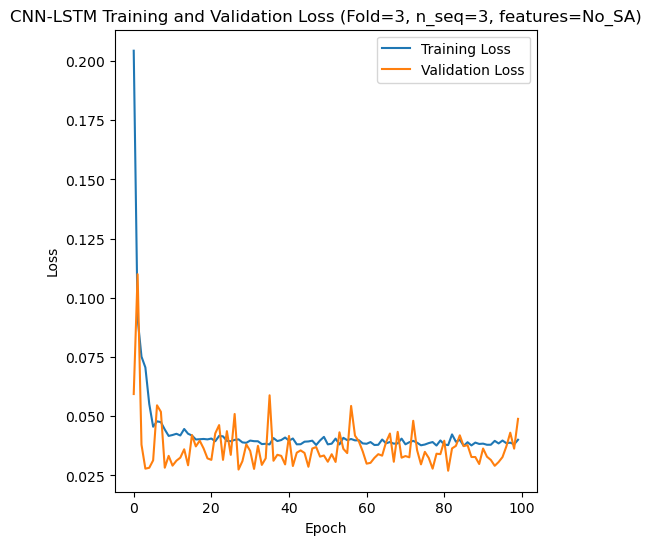

[[ 3.4   2.19  4.28 ... 10.54  6.41  5.39]
 [ 7.94  7.22  7.86 ... 18.27 13.85 11.85]
 [ 5.92  4.91  6.84 ... 14.38  9.59 10.48]
 ...
 [ 3.92  3.    4.93 ... 11.51  7.19  6.46]
 [ 3.98  2.61  4.   ... 10.23  6.65  5.8 ]
 [ 3.84  2.35  4.25 ... 10.6   6.5   5.9 ]]
Epoch 1/100
84/84 [==============================] - 36s 203ms/step - loss: 0.1671 - accuracy: 0.5476 - mae: 0.1458 - rmse: 0.1671 - mape: 27.7573 - pearson: 0.5583 - val_loss: 0.0419 - val_accuracy: 0.9000 - val_mae: 0.0363 - val_rmse: 0.0419 - val_mape: 7.1049 - val_pearson: 0.7292
Epoch 2/100
84/84 [==============================] - 10s 122ms/step - loss: 0.1016 - accuracy: 0.6667 - mae: 0.0890 - rmse: 0.1016 - mape: 16.7914 - pearson: 0.6574 - val_loss: 0.0434 - val_accuracy: 0.9000 - val_mae: 0.0366 - val_rmse: 0.0434 - val_mape: 6.9323 - val_pearson: 0.7425
Epoch 3/100
84/84 [==============================] - 10s 118ms/step - loss: 0.0805 - accuracy: 0.7619 - mae: 0.0722 - rmse: 0.0805 - mape: 13.7455 - pearson: 0.6746 -

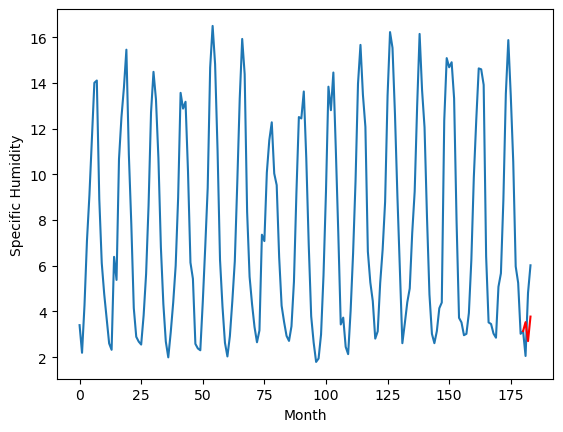

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.75		3.09		-0.66
5.74		2.26		-3.48
5.71		3.33		-2.38
[180, 181, 182, 183]
[7.79, 3.092276805639267, 2.261512452363968, 3.334995800256729]


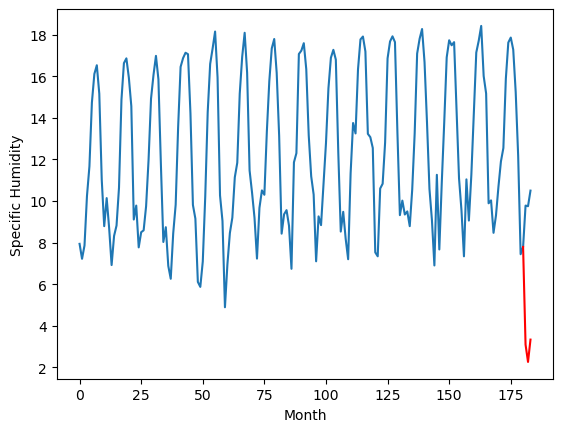

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.83		7.63		-0.20
7.71		6.80		-0.91
10.77		7.87		-2.90
[180, 181, 182, 183]
[5.03, 7.632278265953064, 6.80151534318924, 7.874998691082001]


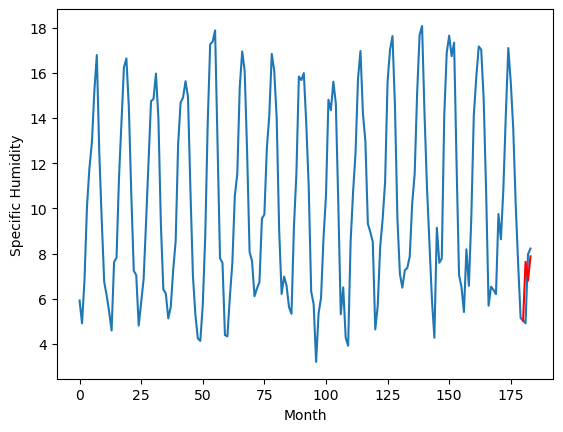

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.81		5.61		-0.20
5.49		4.78		-0.71
8.15		5.85		-2.30
[180, 181, 182, 183]
[4.41, 5.612276805639267, 4.78151197552681, 5.8549943697452544]


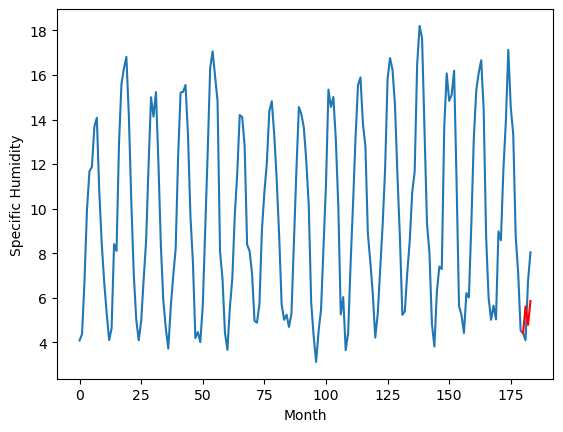

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.04		3.77		-0.27
3.59		2.94		-0.65
6.17		4.01		-2.16
[180, 181, 182, 183]
[4.29, 3.7722758519649506, 2.9415095913410187, 4.014991031885147]


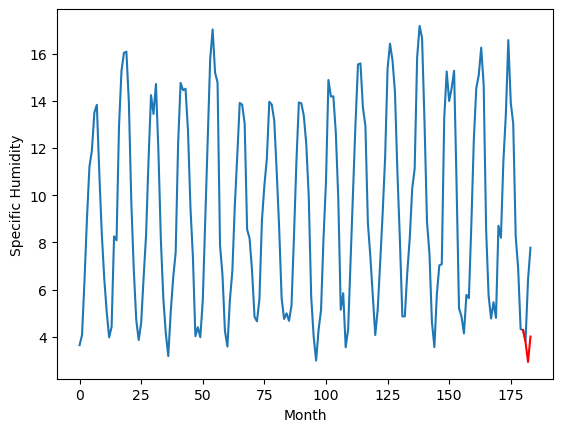

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		3.34		-1.01
3.71		2.51		-1.20
5.20		3.58		-1.62
[180, 181, 182, 183]
[3.47, 3.3422758519649505, 2.5115095913410186, 3.5849890053272246]


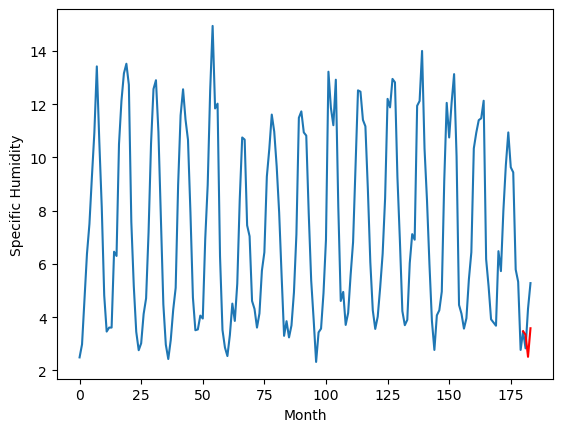

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.37		2.18		-0.19
2.62		1.35		-1.27
4.33		2.43		-1.90
[180, 181, 182, 183]
[4.52, 2.1822816634178164, 1.351519753932953, 2.425005009174347]


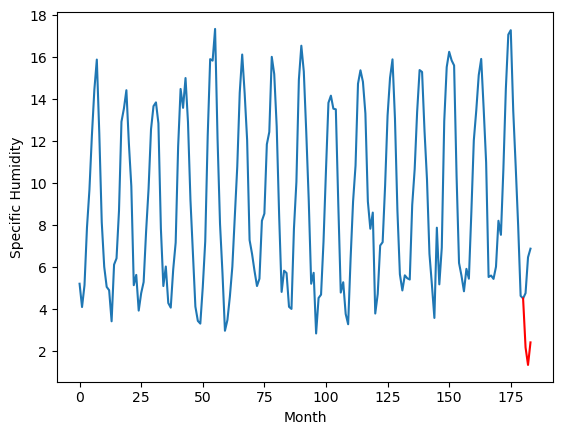

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.91		-0.16
4.44		4.08		-0.36
6.81		5.16		-1.65
[180, 181, 182, 183]
[3.4, 4.912281156778335, 4.081520677804947, 5.1550078403949735]


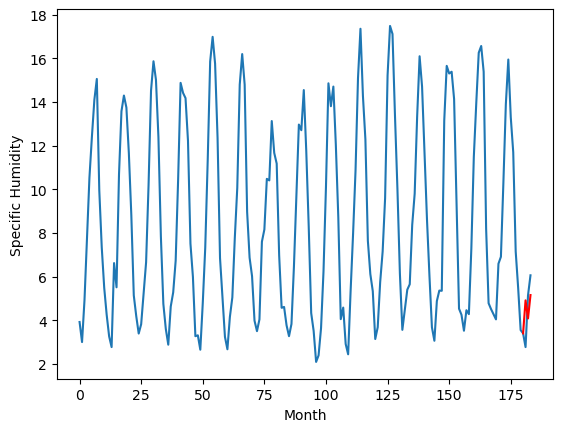

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.57		3.61		0.04
3.00		2.78		-0.22
4.94		3.86		-1.08
[180, 181, 182, 183]
[2.82, 3.612286491394043, 2.7815317940711974, 3.855026705265045]


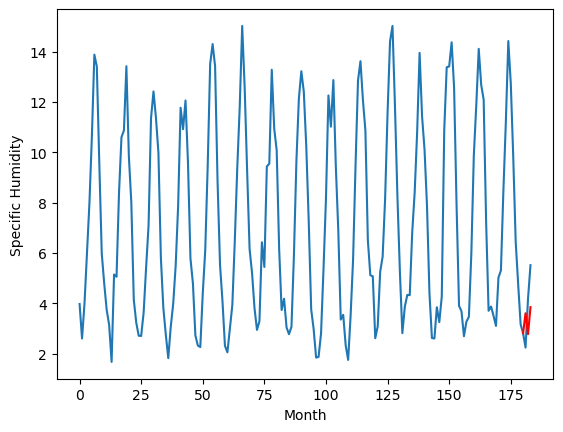

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.66		3.67		0.01
3.02		2.84		-0.18
5.39		3.92		-1.47
[180, 181, 182, 183]
[2.86, 3.672285031080246, 2.841528903245926, 3.9150219070911407]


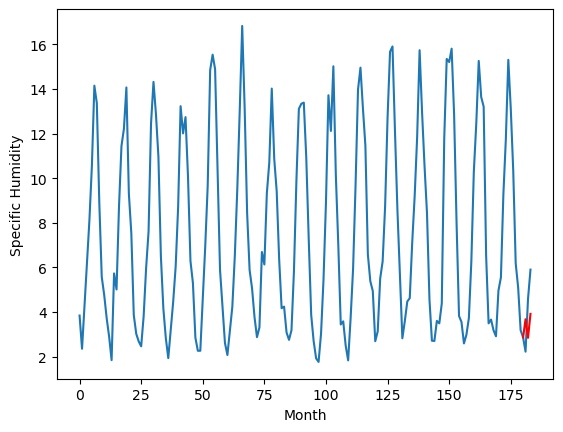

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.46		3.53		0.07
2.89		2.70		-0.19
4.18		3.78		-0.40
[180, 181, 182, 183]
[2.61, 3.532286491394043, 2.7015317940711974, 3.775026705265045]


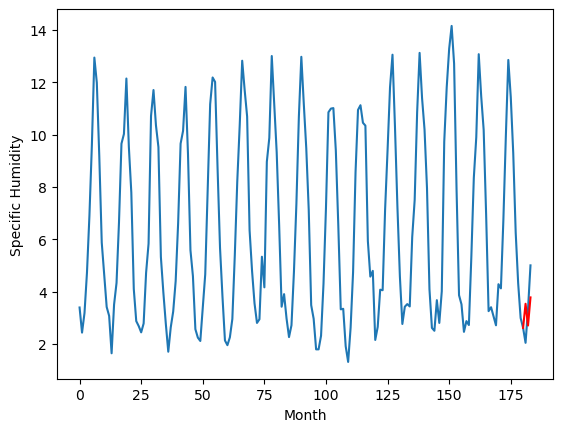

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.96   3.532281
1                 1    3.75   3.092277
2                 2    7.83   7.632278
3                 3    5.81   5.612277
4                 4    4.04   3.772276
5                 5    4.35   3.342276
6                 6    2.37   2.182282
7                 7    5.07   4.912281
8                 8    3.57   3.612286
9                 9    3.66   3.672285
10               10    3.46   3.532286


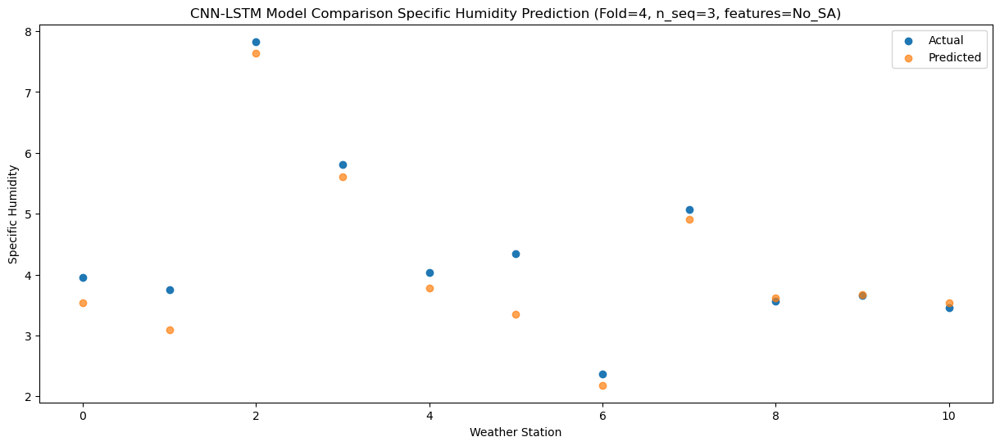

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.87   2.701519
1                 1    5.74   2.261512
2                 2    7.71   6.801515
3                 3    5.49   4.781512
4                 4    3.59   2.941510
5                 5    3.71   2.511510
6                 6    2.62   1.351520
7                 7    4.44   4.081521
8                 8    3.00   2.781532
9                 9    3.02   2.841529
10               10    2.89   2.701532


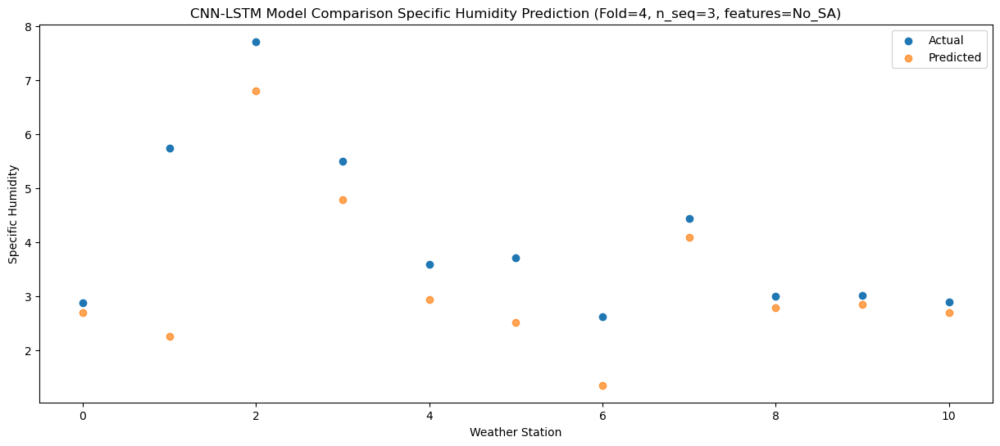

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.63   3.775005
1                 1    5.71   3.334996
2                 2   10.77   7.874999
3                 3    8.15   5.854994
4                 4    6.17   4.014991
5                 5    5.20   3.584989
6                 6    4.33   2.425005
7                 7    6.81   5.155008
8                 8    4.94   3.855027
9                 9    5.39   3.915022
10               10    4.18   3.775027


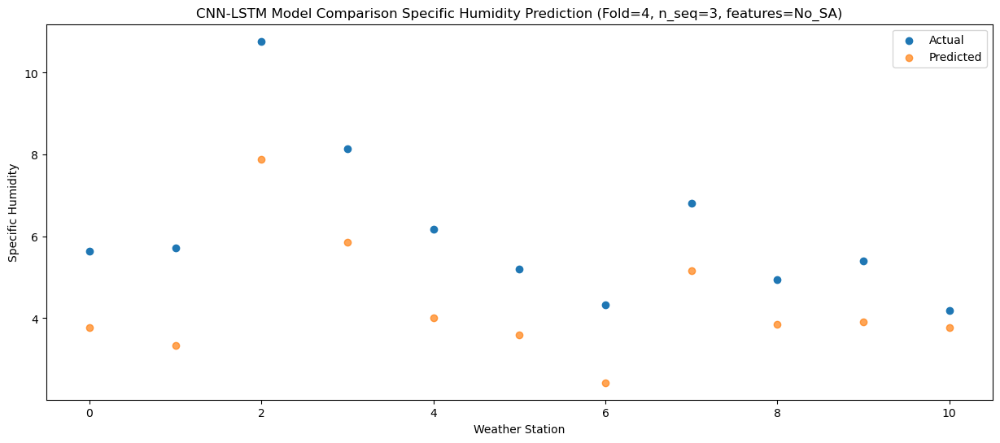

f, t:
[[ 3.96  3.75  7.83  5.81  4.04  4.35  2.37  5.07  3.57  3.66  3.46]
 [ 2.87  5.74  7.71  5.49  3.59  3.71  2.62  4.44  3.    3.02  2.89]
 [ 5.63  5.71 10.77  8.15  6.17  5.2   4.33  6.81  4.94  5.39  4.18]]
[[3.53228116 3.09227681 7.63227827 5.61227681 3.77227585 3.34227585
  2.18228166 4.91228116 3.61228649 3.67228503 3.53228649]
 [2.70151925 2.26151245 6.80151534 4.78151198 2.94150959 2.51150959
  1.35151975 4.08152068 2.78153179 2.8415289  2.70153179]
 [3.7750045  3.3349958  7.87499869 5.85499437 4.01499103 3.58498901
  2.42500501 5.15500784 3.85502671 3.91502191 3.77502671]]
Year at t+1:
t+1 SKRMSE: 0.409899
t+1 KRMSE: 0.409899
t+1 MAE: 0.293512
t+1 SKMAPE: 0.071548
t+1 R2_SCORE: 0.912679
t+1 KMAPE: 0.071548
t+1 PEARSON: 0.952324
t+1 AVERAGE ACTUAL: 4.351818
Year at t+2:
t+2 SKRMSE: 1.249186
t+2 KRMSE: 1.249186
t+2 MAE: 0.847572
t+2 SKMAPE: 0.197936
t+2 R2_SCORE: 0.332755
t+2 KMAPE: 0.197936
t+2 PEARSON: 0.652880
t+2 AVERAGE ACTUAL: 4.098182
Year at t+3:
t+3 SKRMSE: 1.903747

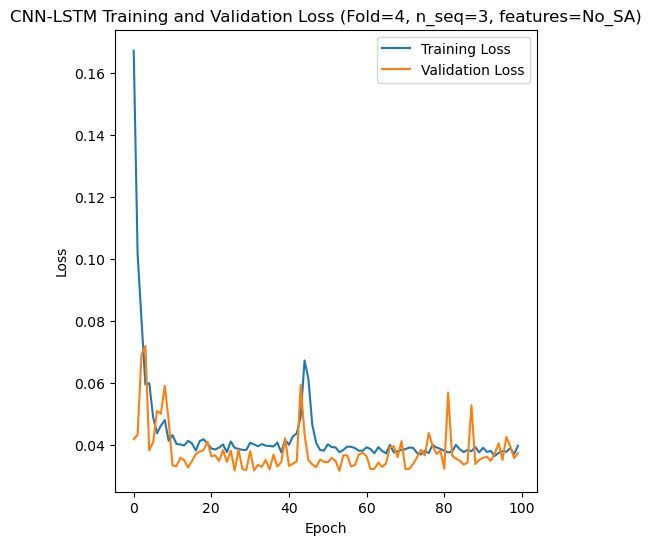

[[0.6800726758226684], [0.6474891412926743], [0.993761349121729], [1.0736517232400757], [1.3357567410797238]]
[[array(0.68007268)], [array(0.64748914)], [array(0.99376135)], [array(1.07365172)], [array(1.33575674)]]
[[0.534142180166461], [0.5026510789900117], [0.7090154118971389], [0.8619459103093003], [0.9777835685917824]]
[[0.09761566824908752], [0.10919806080920443], [0.13697889340834538], [0.2242222822374553], [0.18767078110911767]]
[[0.8778575063484649], [0.8972139881827806], [0.68013598286302], [0.17202427911504115], [0.4639826649656912]]
[[array(0.09761567)], [array(0.10919806)], [array(0.13697889)], [array(0.22422228)], [array(0.18767078)]]
[[array(0.9090976)], [array(0.93597076)], [array(0.80734702)], [array(0.74553284)], [array(0.74951402)]]
[ 3.9   3.41  6.58  5.74  6.45  8.66  8.41  8.56 10.41  5.55  5.46  8.91
  7.36  6.96  9.8   4.02  4.61  6.18  6.35  6.4   7.99  4.55  4.58  6.2
  4.32  3.64  6.7   4.11  3.66  5.46  3.76  3.02  4.64  2.59  2.91  4.44
  6.45  6.64  8.17  

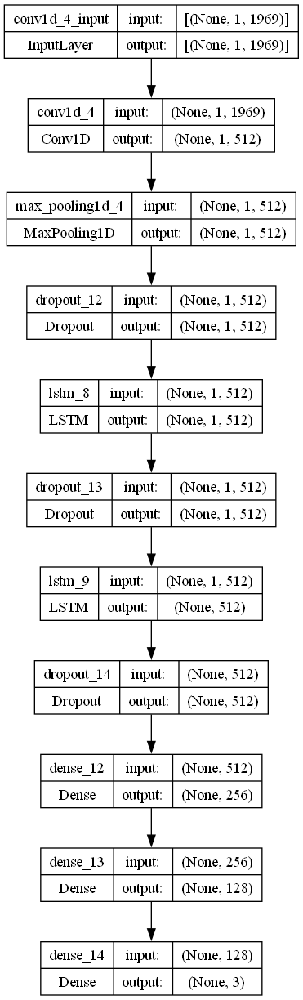

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.0014499068387407005
    optimizer = Adam(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 512
    dropout_rate = 0.26802352848095357

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))
print("")
print("Average Specific Humidity:"+str(np.mean(actual_avg_list)))
print("RMSE % of Specific Humidity:"+str(np.mean(rmse2_avg_list)/np.mean(actual_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S3_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)